# Data Mining - Insurance Project
**Group Members**:
- Canhoto, Vera (m20210659@novaims.unl.pt)
- Correa, Lucas (m20211006@novaims.unl.pt)
- Shin, Doyun (m20200565@novaims.unl.pt)

In [1]:
# Jupyter notebook display size adjustment
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

<a class="anchor" id="0.1"></a>

# **Table of Contents**

Structured as per CRISP-DM method, but it was used flexibly to better reflect the focus of the project. Further qualitative elements are addressed in the report attached where applicable.

1. [Business Understanding](#1)
   - 1.1 [Business Objectives](#1.1)
   - 1.2 [Situation Assessment](#1.2)
   - 1.3 [Data Mining Goals](#1.3)
   - 1.4 [Project Plan](#1.4)


2. [Data Understanding](#2)
   - 2.1 [Initial Data Collection](#2.1)
   - 2.2 [Data Description](#2.2)
   - 2.3 [Data Exploration](#2.3)
   - 2.4 [Data Quality Verification](#2.4)
  
  
3. [Data Preparation](#3)
   - 3.1 [Data Cleaning](#3.1) 
   - 3.2 [Data Construction](#3.2) 
   - 3.3 [Data Selection](#3.3)
   
   
4. [Clustring](#4)
   - 4.1 [Kmeans + Hierarchical Clustering](#4.1) 
   - 4.2 [K-prototypes](#4.2)
 

# 1. Business Understanding <a class="anchor" id="1"></a>

## 1.1 Business Objective <a class="anchor" id="1.1"></a>

To better understand customer profiles, especially from the marketing department's perspectives.

## 1.2 Situation Assessment <a class="anchor" id="1.2"></a>

**Computational power**

Computer1: 

Computer2: 

Computer3: 
- CPU: Intel(R) Core i5-8250U CPU
- Memory: 8GB
- GPU: Intel UHD Graphics 620
    
No significant hindrance identified in the initial stage, considering the size of the data and the required task.

**Programming Language:** Python

**Available / utilized libraries**

In [2]:
#!pip install pyod
#!pip install umap-learn
#!pip install kmodes
#!pip install pandas_profiling
#!pip install plotly

In [3]:
import pandas as pd
import numpy as np
import math
from math import ceil
import statsmodels.api as sm
import scipy as sp
from scipy import stats
from scipy.stats import chi2


# Data Exploration
from pandas_profiling import ProfileReport

# Missing Values imputation
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OrdinalEncoder

# outliers
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from pyod.models.copod import COPOD as COF
from statsmodels import robust

# Preprocessing
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import KBinsDiscretizer

# Clustering / Analysis
from kmodes.kprototypes import KPrototypes
from sklearn.cluster import KMeans

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import set_link_color_palette
from matplotlib.lines import Line2D
import matplotlib.cm as cm

from sklearn.metrics import silhouette_samples, silhouette_score


# Visualization
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

import warnings
from tqdm import tqdm
warnings.filterwarnings('ignore')

%matplotlib inline
pd.set_option("display.max_rows", 20)

## 1.3 Data Mining Goals  <a class="anchor" id="1.3"></a>

In [4]:
# Conduct customer segmentation on the customer data => data mining problem type is segmentation


## 1.4 Project Plan  <a class="anchor" id="1.4"></a>

In [5]:
# possible clustering techniques: KNN or K-prototype, dependig on the data.

# 2. Data Understanding <a class="anchor" id="2"></a>

## 2.1 Initial Data Collection <a class="anchor" id="2.1"></a>

We have only one source of data hence assessment of potential quality problem from data merge is not applicable

In [6]:
df = pd.read_sas('a2z_insurance.sas7bdat')
orglen = len(df)
df.tail()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
10291,10292.0,1984.0,1949.0,b'4 - PhD',3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10292,10293.0,1977.0,1952.0,b'1 - Basic',2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10293,10294.0,1994.0,1976.0,b'3 - BSc/MSc',2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10294,10295.0,1981.0,1977.0,b'1 - Basic',1971.0,2.0,1.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91
10295,10296.0,1990.0,1981.0,b'4 - PhD',2815.0,1.0,1.0,463.75,0.27,414.08,94.45,141.25,6.89,12.89


## 2.2 Data Description  <a class="anchor" id="2.2"></a>
Based on the metadata provided with some errors in the project description was corrected (eg., all the variable names, description of Birthday was "Customer’s first policy", etc)

Data on 10,290 Customers of the insurance company

| Name | Meaning | Additional Info | 
| :--: | :--------| :--------| 
| CustID | ID | - | 
| FirstPolYear | Year of the customer's first policy | May be considered as the first year as a customer |
| Birthday | Customer's birthday | The current year of the database is 2016|
| EducDeg | Academic Degree | - |
| MonthSal | Gross monthly salary (€) | - |
| GeoLivArea | Living area | No further information provided about the meaning of the area codes |
| Children | Binary variable (Y=1) | - |
| CustMonVal | Customer Monetary Value | Lifetime value = (annual profit from the customer) X (number of years that they are a customer) - (acquisition cost) |
| ClaimsRate | Claims Rate| Amount paid by the insurance company (€)/ Premiums (€) Note: in the last 2 years|
| PremMotor | Premiums (€) in LOB: Motor | Annual Premiums (2016) Negative premiums may manifest reversals occurred in the current year, paid in previous one(s). Applicable to all Prem* variables |
| PremHousehold | Premiums (€) in LOB: Household | * |
| PremHealth | Premiums (€) in LOB: Health | * |
| PremLife | Premiums (€) in LOB: Life | * |
| PremWork | Premiums (€) in LOB: Work| * |

## 2.3 Data Exploration  <a class="anchor" id="2.3"></a>

In [7]:
# Check default import data types of the features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10279 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustID,10296.0,5148.500000,2972.343520,1.00,2574.75,5148.50,7722.2500,10296.00
FirstPolYear,10266.0,1991.062634,511.267913,1974.00,1980.00,1986.00,1992.0000,53784.00
BirthYear,10279.0,1968.007783,19.709476,1028.00,1953.00,1968.00,1983.0000,2001.00
MonthSal,10260.0,2506.667057,1157.449634,333.00,1706.00,2501.50,3290.2500,55215.00
GeoLivArea,10295.0,2.709859,1.266291,1.00,1.00,3.00,4.0000,4.00
Children,10275.0,0.706764,0.455268,0.00,0.00,1.00,1.0000,1.00
CustMonVal,10296.0,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,0.742772,2.916964,0.00,0.39,0.72,0.9800,256.20
PremMotor,10262.0,300.470252,211.914997,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10296.0,210.431192,352.595984,-75.00,49.45,132.80,290.0500,25048.80


In [9]:
# Check the number of entries.
df.shape

(10296, 14)

**Inconsistency in the number of customers**

The data was supposed to have 10290 records, hence a check is needed.

In [10]:
# The number of rows exceeds the number of customers by 6. Check for duplicates excluding CustID (unique)
tmp = df.loc[:, df.columns != 'CustID']
tmp.drop_duplicates()
tmp

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,1984.0,1949.0,b'4 - PhD',3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10292,1977.0,1952.0,b'1 - Basic',2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10293,1994.0,1976.0,b'3 - BSc/MSc',2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10294,1981.0,1977.0,b'1 - Basic',1971.0,2.0,1.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


Confirmed later by the provider of the data there it was a rounding error.

In [11]:
# Check for duplicates of the unique customer ID
df.duplicated(subset='CustID').sum()

0

In [12]:
# EducDeg appears to be ordinal. In which case, it would be better to convert it before producing profile report. (Normally would be included in Feature Engineering section)
df.EducDeg.unique()

array([b'2 - High School', b'1 - Basic', b'3 - BSc/MSc', b'4 - PhD', nan],
      dtype=object)

In [13]:
# Decode to handle bytes then extract the numerical characters and replace the string to numerical, ordinal variable.
df['EducDeg'] = df['EducDeg'].str.decode('UTF-8').str.extract('(\d+)', expand=False)
df

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,10292.0,1984.0,1949.0,4,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10292,10293.0,1977.0,1952.0,1,2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10293,10294.0,1994.0,1976.0,3,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10294,10295.0,1981.0,1977.0,1,1971.0,2.0,1.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


In [14]:
# Pandas prifiling - disabled after the initial report 
#profile = ProfileReport(df, title="Pandas Profiling Report")
#profile.to_file("DM_PandasProfile.html")
#profile.to_notebook_iframe()

**Consideration A**

A1. Some decimal values such as year variable may just be integers. Need to investigate the nature of those values and required treatment (eg., if there's year 1975.7, it can't just be rounded to 1976 without knowing the nature of this entry)<br>
A2. Presence of extreme values that are obviously impossible (fails coherence check) in FirstPolYear and BirthYear.<br>
A3. Outliers that are theoretically possible (or uncertain whether it's impossible), hence requiring further investigation in MonthSal, ClaimsRate, and Prem variables.<br>
A4. EducDeg can be converted to numerical, ordinal variable<br>
A5. GeoLivArea and Children == Categorical (should be converted from float to object type)<br>
A6. Some missing values in most variables<br>
A7. There are 10296 entries instead of 10290 entries as stated in the project description. Quick duplicate check did not reveal any reason behind it. Needs to be confirmed (UPDATE 21 Oct: Consider it a rounding error)<br>


The section below investigates these considerations:

## 2.4 Data Quality Verification  <a class="anchor" id="2.4"></a>

### 2.4.1 Decimal values check  <a class="anchor" id="2.4.1"></a>

In regards to Consideration A1

In [15]:
# Check 
tmp = int(len(df)) # max length

# Instead of counting what is not an integer, we need to count what IS an integer and subtract from the max length due to the presence of NAN values.
for column in df:
    if (df[column].dtype) == "float64":
        only_num = [num for num in df[column] if num % 1 == 0]
        count = tmp-len(only_num)
        print('{}: {}'.format(column, count))  
        

CustID: 0
FirstPolYear: 30
BirthYear: 17
MonthSal: 36
GeoLivArea: 1
Children: 21
CustMonVal: 9653
ClaimsRate: 9777
PremMotor: 10296
PremHousehold: 9205
PremHealth: 10294
PremLife: 9433
PremWork: 9376


In [16]:
# Compare with null values. The result shows some columns--CustID, FirstPolYear, BirthYear, MonthSal, GeoLivArea, Children
# are just integers mixed with nulls.
df.isnull().sum()

CustID             0
FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

**Missing Values in PremMotor, PremHealth, PremLife, PremWork**

In [17]:
# Count number of zeros in all columns of Dataframe
for c in df.columns:
    column = df[c]
    # Get the count of Zeros in column 
    count = (column == 0).sum()
    print('Number of zeros in column', c, ' is : ', count)

Number of zeros in column CustID  is :  0
Number of zeros in column FirstPolYear  is :  0
Number of zeros in column BirthYear  is :  0
Number of zeros in column EducDeg  is :  0
Number of zeros in column MonthSal  is :  0
Number of zeros in column GeoLivArea  is :  0
Number of zeros in column Children  is :  3013
Number of zeros in column CustMonVal  is :  2
Number of zeros in column ClaimsRate  is :  58
Number of zeros in column PremMotor  is :  0
Number of zeros in column PremHousehold  is :  60
Number of zeros in column PremHealth  is :  0
Number of zeros in column PremLife  is :  0
Number of zeros in column PremWork  is :  0


For the following reasons we will treat the missing values in Prem- variables as 0:
1. There is no missing value in Prem-Household, however, there are zeroes.
2. For all other Prem- variables it's the opposite: there are no zeroes, but only missing values.
3. We infer it's the company's internal practice to keep PremHousehold filled with a value at all times to prevent all values missing across all the prem-variables, but permit non-entry in other variables in case of 0 premium.
4. The number of missing values in Prem- variables is very low, at most 104 entries (PremLife, less than 1% of the data). Hence the impact of this inferrence is expected to be small to the overall quality of the data. We convert these missing values to 0.

### 2.4.2 Initial Coherence Check  <a class="anchor" id="2.4.2"></a>

**Min-max values**

In [18]:
# We can detect obviously impossible values from min - max values.
df.describe().loc[['min','max']]

,CustID,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
min,1.0,1974.0,1028.0,333.0,1.0,0.0,-165680.42,0.0,-4.11,-75.0,-2.11,-7.0,-12.0
max,10296.0,53784.0,2001.0,55215.0,4.0,1.0,11875.89,256.2,11604.42,25048.8,28272.00,398.3,1988.7


- The above indicates max value of FirstPolYear, minimum value of BirthYear are impossible values.

**FirstPolYear**

In [19]:
# The min value of FirstPolYear (1974) is a possible value. Hence only the largest value needs to be checked.
df.nlargest(5, 'FirstPolYear')

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
9294,9295.0,53784.0,1948.0,3,3268.0,1.0,0.0,348.85,0.37,351.40,15.0,187.37,22.45,17.78
23,24.0,1998.0,1961.0,2,2870.0,4.0,1.0,290.05,0.64,222.04,329.5,248.38,48.01,33.56
65,66.0,1998.0,1941.0,3,3760.0,1.0,0.0,132.27,0.78,276.83,175.6,261.27,6.89,-6.11
279,280.0,1998.0,1938.0,1,4386.0,1.0,0.0,193.04,0.79,96.02,541.2,189.59,127.69,90.35
506,507.0,1998.0,1942.0,1,3743.0,1.0,0.0,-46.67,1.02,85.24,554.0,307.39,46.12,24.45


No indication the data integrity is compromised, considering there's only one illogical value (53784). Dropping the row can be considered.

In [20]:
# Drop those two rows
df = df[df['FirstPolYear'] != 53784]

**BirthYear**

In [21]:
# The max value of BirthYear (2001) is possible. Check the mins. 
df.nsmallest(5, 'BirthYear')

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
7195,7196.0,1993.0,1028.0,3,2830.0,4.0,0.0,146.02,0.77,428.97,192.80,108.91,1.89,23.67
329,330.0,1979.0,1935.0,2,4292.0,1.0,1.0,-47.77,1.04,457.64,-20.55,94.35,47.23,-1.11
958,959.0,1996.0,1935.0,1,4133.0,2.0,1.0,594.33,0.38,257.05,511.20,129.58,29.56,78.57
1013,1014.0,1996.0,1935.0,3,4247.0,2.0,0.0,-98.79,1.09,142.36,299.50,307.17,24.67,73.79
3191,3192.0,1990.0,1935.0,3,4475.0,3.0,0.0,433.97,0.45,111.80,339.50,268.83,106.91,12.56


No indication the data integrity is compromised, considering there's only one illogical value (1028). Dropping the row can be considered or imputation from EducDeg.

In [22]:
# Drop those two rows
df = df[df['BirthYear'] != 1028]

In [23]:
df.describe().loc[['min','max']]

,CustID,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
min,1.0,1974.0,1935.0,333.0,1.0,0.0,-165680.42,0.0,-4.11,-75.0,-2.11,-7.0,-12.0
max,10296.0,1998.0,2001.0,55215.0,4.0,1.0,11875.89,256.2,11604.42,25048.8,28272.00,398.3,1988.7


**Cases of BirthYear < FirstPolYear, i.e., people born after the FirstPolYear**

In [24]:
# Check for entries where BirthYear < FirstPolYear (Assuming an unborn person cannot be insured)
df.query('FirstPolYear < BirthYear')

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
1,2.0,1981.0,1995.0,2,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
13,14.0,1983.0,2000.0,1,1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
18,19.0,1981.0,1982.0,1,1414.0,3.0,1.0,230.38,0.71,313.17,373.40,121.80,14.78,72.57
22,23.0,1976.0,1986.0,2,1495.0,1.0,1.0,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
40,41.0,1994.0,1995.0,2,1177.0,4.0,1.0,121.36,0.84,52.01,455.65,135.47,146.36,148.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10268,10269.0,1987.0,1988.0,3,1414.0,3.0,1.0,50.46,0.90,129.58,167.80,184.48,165.92,75.46
10273,10274.0,1989.0,1992.0,2,1035.0,1.0,1.0,293.51,0.58,235.71,195.60,103.13,170.92,58.12
10284,10285.0,1980.0,1987.0,3,1504.0,4.0,1.0,-1.55,0.96,390.63,29.45,179.70,-6.00,NaN
10288,10289.0,1982.0,1993.0,2,1465.0,1.0,1.0,795.15,0.35,67.79,820.15,102.13,182.48,86.46


2160 rows = 21% of the total data. Data integrity may have been compromised, requires a clarification. Considering the originally incorrect description of BirthYear, this feature may be the problem rather than FirstPolYear.

In [25]:
yr_no_df = df.query('FirstPolYear < BirthYear').copy()

<AxesSubplot:xlabel='BirthYear'>

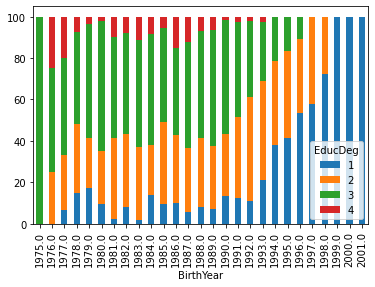

In [26]:
# Assumption 1: EducDeg should correspond with BirthYear
aggre= yr_no_df[['BirthYear','EducDeg']].groupby(['BirthYear','EducDeg'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

- The BirthYear variable follows highly logical correlation with EducDeg, especially looking at primary education, which is mandatory for all citizens in Portugal

<AxesSubplot:xlabel='BirthYear'>

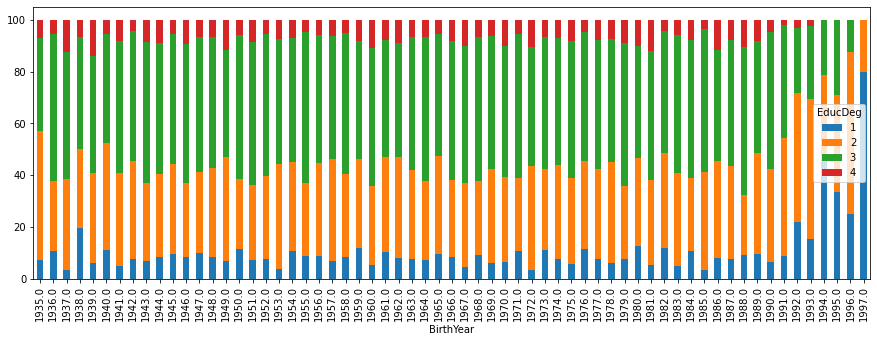

In [27]:
# Compare the trend where the coherence check pases
yr_ok_df = df.query('FirstPolYear >= BirthYear').copy()

plt.rcParams['figure.figsize'] = [15, 5]
aggre= yr_ok_df[['BirthYear','EducDeg']].groupby(['BirthYear','EducDeg'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

<AxesSubplot:xlabel='BirthYear'>

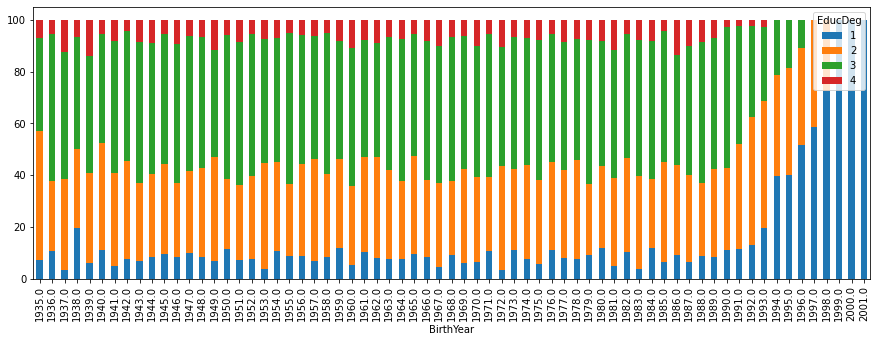

In [28]:
# Education Trend in all data
plt.rcParams['figure.figsize'] = [15, 5]
aggre= df[['BirthYear','EducDeg']].groupby(['BirthYear','EducDeg'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

- Again to highlight: the BirthYear variable follows highly logical correlation with EducDeg, especially looking at primary education, which is mandatory for all citizens in Portugal
- meaning, if we reject BrithYear variable, we should suspect EducDeg variable as well.

<AxesSubplot:xlabel='FirstPolYear'>

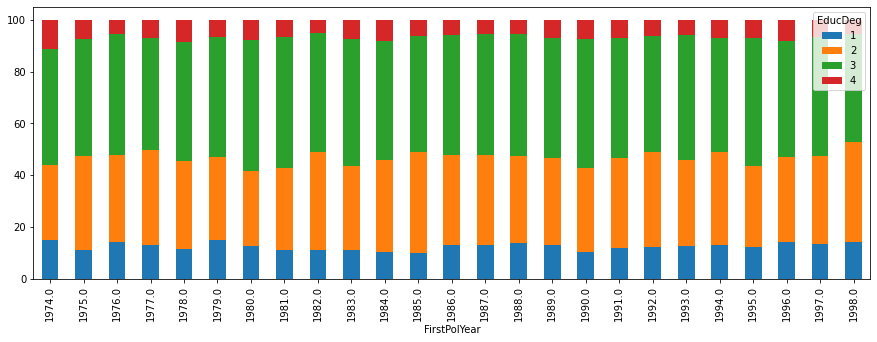

In [29]:
# Education Trend based on FirstPolYear
plt.rcParams['figure.figsize'] = [15, 5]
aggre= df[['FirstPolYear','EducDeg']].groupby(['FirstPolYear','EducDeg'])['FirstPolYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

In [30]:
# Assumption 2: Children should correspond with BirthYear
# Number of rows per birthyear
yr_no_df['BirthYear'].value_counts().sort_index()

1975.0      3
1976.0      4
1977.0     15
1978.0     27
1979.0     29
         ... 
1997.0    128
1998.0     94
1999.0     69
2000.0     35
2001.0     12
Name: BirthYear, Length: 27, dtype: int64

In [31]:
pd.set_option("display.max_rows", 28)
yr_no_df.groupby('BirthYear', as_index=False)['Children'].mean()

,BirthYear,Children
0,1975.0,1.000000
1,1976.0,0.750000
2,1977.0,0.933333
3,1978.0,0.962963
4,1979.0,0.862069
5,1980.0,0.976744
6,1981.0,0.951220
7,1982.0,0.940000
8,1983.0,0.925926
9,1984.0,0.957746


In [32]:
yr_no_df.loc[(yr_no_df["BirthYear"] == 1975) & (yr_no_df["FirstPolYear"] < 1975)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
741,742.0,1974.0,1975.0,3,2039.0,3.0,1.0,453.87,0.17,479.98,14.45,83.35,0.89,-0.11
4721,4722.0,1974.0,1975.0,3,1939.0,4.0,1.0,-20.00,0.99,320.95,78.35,236.60,5.89,0.89
8427,8428.0,1974.0,1975.0,3,2348.0,1.0,1.0,423.32,0.23,474.31,-15.55,106.91,5.89,11.00


In [33]:
yr_no_df.loc[(yr_no_df["BirthYear"] == 1976) & (yr_no_df["FirstPolYear"] < 1976)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
924,925.0,1975.0,1976.0,4,1783.0,3.0,1.0,-1.21,0.96,488.87,8.90,87.46,0.89,14.89
5535,5536.0,1974.0,1976.0,3,2450.0,4.0,0.0,533.32,0.34,151.25,310.05,60.90,115.91,212.93
8498,8499.0,1975.0,1976.0,2,1944.0,1.0,1.0,-72.12,1.07,298.61,39.45,213.15,7.78,86.57
9127,9128.0,1974.0,1976.0,3,1622.0,4.0,1.0,-40.00,1.03,514.32,-5.00,61.79,-5.00,NaN


In [34]:
yr_no_df.loc[(yr_no_df["BirthYear"] == 1977) & (yr_no_df["FirstPolYear"] < 1977)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
134,135.0,1976.0,1977.0,4,1810.0,2.0,1.0,543.21,0.14,490.98,79.45,86.35,-1.11,3.89
161,162.0,1975.0,1977.0,3,2285.0,1.0,0.0,471.21,0.25,349.40,87.80,142.47,9.78,68.79
268,269.0,1976.0,1977.0,2,1697.0,4.0,1.0,-42.67,1.02,331.84,177.80,181.70,44.12,17.67
1812,1813.0,1976.0,1977.0,3,2223.0,1.0,1.0,-51.44,1.05,468.09,-20.55,95.13,2.89,5.89
3216,3217.0,1975.0,1977.0,1,2196.0,1.0,1.0,179.26,0.73,204.26,234.50,178.81,24.45,118.58
4891,4892.0,1975.0,1977.0,2,1920.0,1.0,1.0,432.74,0.51,222.04,408.40,127.58,69.68,103.02
5388,5389.0,1976.0,1977.0,4,1810.0,2.0,1.0,-26.11,1.01,NaN,79.45,86.35,-1.11,3.89
5491,5492.0,1976.0,1977.0,3,1858.0,1.0,1.0,-52.76,1.05,385.63,-6.10,159.14,26.56,11.00
5526,5527.0,1974.0,1977.0,2,1949.0,4.0,1.0,-25.00,1.00,128.47,575.10,173.70,74.68,96.24
6213,6214.0,1976.0,1977.0,3,1601.0,1.0,1.0,452.54,0.17,457.42,-0.55,99.02,0.89,19.78


In [35]:
yr_no_df.loc[(yr_no_df["BirthYear"] == 1978) & (yr_no_df["FirstPolYear"] < 1978)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
293,294.0,1977.0,1978.0,2,2128.0,1.0,1.0,541.54,0.30,348.62,241.70,151.14,44.23,23.78
343,344.0,1976.0,1978.0,3,782.0,1.0,1.0,413.41,0.47,185.48,300.05,298.50,24.45,22.67
1034,1035.0,1976.0,1978.0,3,1775.0,2.0,1.0,187.38,0.72,222.71,230.05,295.61,6.00,11.67
1071,1072.0,1975.0,1978.0,2,2366.0,1.0,1.0,357.08,0.32,397.63,-15.55,145.14,25.56,7.78
1763,1764.0,1977.0,1978.0,1,2230.0,4.0,1.0,464.09,0.26,468.42,78.35,96.24,4.78,15.89
1796,1797.0,1975.0,1978.0,2,1735.0,3.0,1.0,125.37,0.78,407.41,102.25,116.91,33.34,14.78
1934,1935.0,1977.0,1978.0,3,1513.0,3.0,1.0,-53.98,1.05,410.52,-11.10,159.92,NaN,6.78
2518,2519.0,1975.0,1978.0,2,2045.0,3.0,1.0,213.60,0.71,238.60,314.50,221.71,42.34,18.45
3468,3469.0,1974.0,1978.0,2,1151.0,1.0,1.0,-189.78,1.30,370.18,-45.55,111.02,73.68,49.23
3679,3680.0,1977.0,1978.0,1,2083.0,4.0,1.0,564.10,0.27,337.62,236.70,188.59,14.78,24.56


<AxesSubplot:xlabel='BirthYear'>

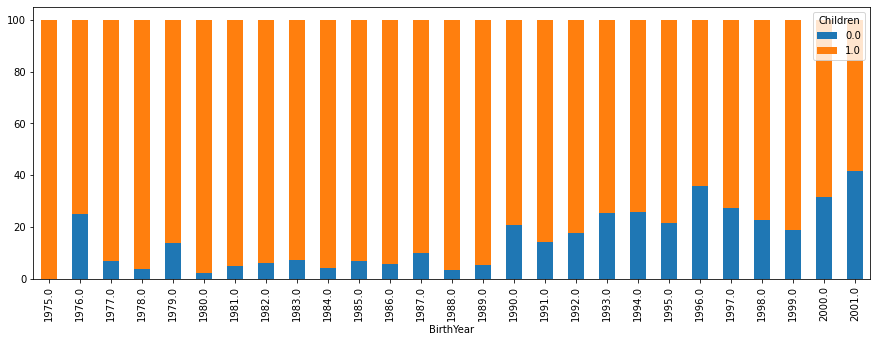

In [36]:
# Assumption 2: Children should correspond with BirthYear
aggre = yr_no_df[['BirthYear','Children']].groupby(['BirthYear','Children'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

In [37]:
yr_no_df.count()

CustID           1997
FirstPolYear     1997
BirthYear        1997
EducDeg          1996
MonthSal         1985
GeoLivArea       1997
Children         1994
CustMonVal       1997
ClaimsRate       1997
PremMotor        1989
PremHousehold    1997
PremHealth       1985
PremLife         1985
PremWork         1981
dtype: int64

- significant ratio of people under age of 18 appear to have children. This may be illogical, but that may be due to the sampling bias--if you have a kid at very young age, you are highly likely to seek insurance coverage.

In [38]:
# If we only look at people who were adults when they made their first policy
adultfirstpol = df.copy()
adultfirstpol.insert(3, 'entryAge', (adultfirstpol['FirstPolYear'] - adultfirstpol['BirthYear']))
adultfirstpol = adultfirstpol.loc[(adultfirstpol["entryAge"] >= 18)]
len(adultfirstpol)

5194

<AxesSubplot:xlabel='BirthYear'>

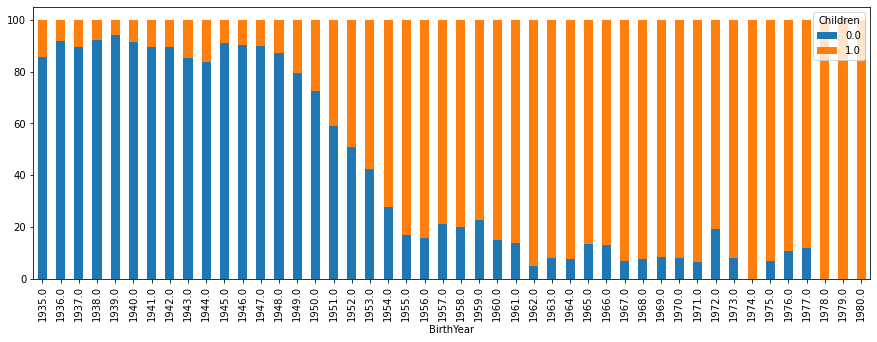

In [39]:
aggre = adultfirstpol[['BirthYear','Children']].groupby(['BirthYear','Children'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

<AxesSubplot:xlabel='entryAge'>

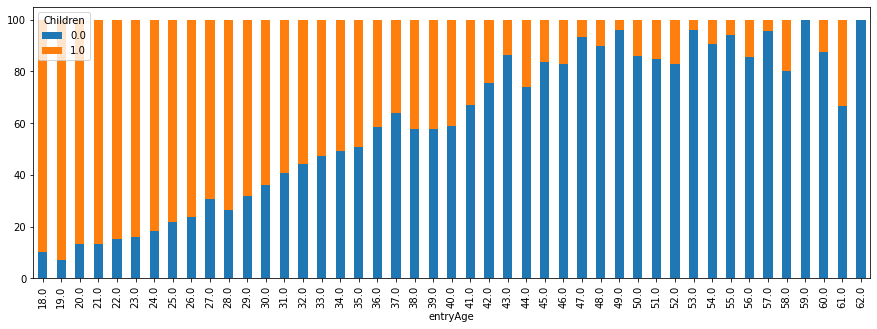

In [40]:
aggre = adultfirstpol[['entryAge','Children']].groupby(['entryAge','Children'])['entryAge'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

In [41]:
# If we only look at minimum age for insurance coverage
minagefirstpol = df.copy()
minagefirstpol.insert(3, 'entryAge', (minagefirstpol['FirstPolYear'] - minagefirstpol['BirthYear']))
minagefirstpol = minagefirstpol.loc[(minagefirstpol["entryAge"] >= 10)]
len(minagefirstpol)

6546

<AxesSubplot:xlabel='entryAge'>

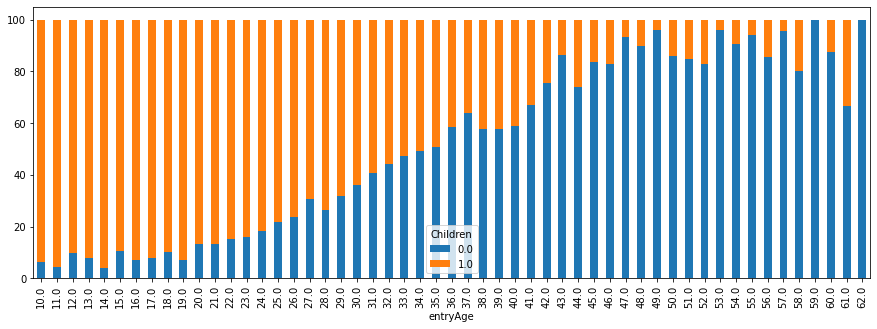

In [42]:
aggre = minagefirstpol[['entryAge','Children']].groupby(['entryAge','Children'])['entryAge'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

In [43]:
pd.set_option("display.max_rows", None)

In [44]:
yrcheck_df = df.query('FirstPolYear >= BirthYear').copy()
yrcheck_df['BirthYear'].value_counts().sort_index()

1935.0     14
1936.0     37
1937.0     57
1938.0     76
1939.0    100
1940.0    126
1941.0    145
1942.0    161
1943.0    163
1944.0    170
1945.0    165
1946.0    182
1947.0    170
1948.0    164
1949.0    178
1950.0    150
1951.0    185
1952.0    186
1953.0    192
1954.0    184
1955.0    171
1956.0    173
1957.0    173
1958.0    171
1959.0    171
1960.0    165
1961.0    155
1962.0    205
1963.0    186
1964.0    191
1965.0    160
1966.0    168
1967.0    179
1968.0    199
1969.0    130
1970.0    170
1971.0    149
1972.0    143
1973.0    163
1974.0    186
1975.0    173
1976.0    165
1977.0    168
1978.0    146
1979.0    134
1980.0    127
1981.0    149
1982.0    111
1983.0    103
1984.0    113
1985.0     85
1986.0     86
1987.0     78
1988.0     77
1989.0     74
1990.0     64
1991.0     46
1992.0     32
1993.0     39
1994.0     33
1995.0     24
1996.0      8
1997.0      5
Name: BirthYear, dtype: int64

<AxesSubplot:xlabel='BirthYear'>

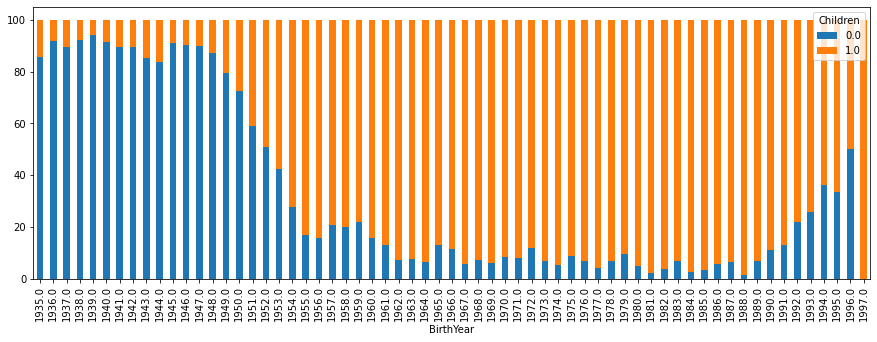

In [45]:
# Compare the trend where the coherence check pases
yrcheck_df = df.query('FirstPolYear >= BirthYear').copy()

plt.rcParams['figure.figsize'] = [15, 5]
aggre = yrcheck_df[['BirthYear','Children']].groupby(['BirthYear','Children'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

- All data from birthyear 1997 fails coherence test. In year 2016, these individuals are 19 years old. But the data refers to premium paid in 2016, meaning the year people born in 1997 entered the contract was 2015, when they were 18. Note, Age of 18 is the age you are no longer required parental consent to make an insurance policy.
- older you get, less likely you have children: Children variable may not be whether they have a child, but whether they have a child in the household. The graph above follows this trend.

<AxesSubplot:xlabel='BirthYear'>

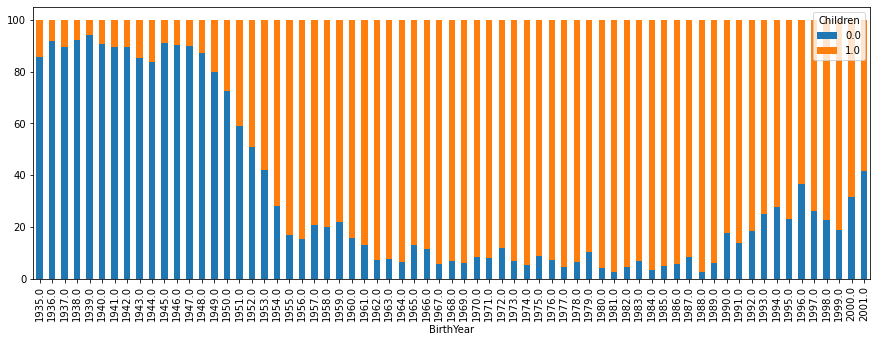

In [46]:
# Total trend
plt.rcParams['figure.figsize'] = [15, 5]
aggre = df[['BirthYear','Children']].groupby(['BirthYear','Children'])['BirthYear'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

In [47]:
len(df[(df['Children'] == 1) & (df['BirthYear'] == 1999)])

56

In [48]:
# You can be as young as 10 to enter an insurance policy as long as you have parental consent(needs to be checked for portugal)
# PremMotor check, since minimum age for driving is 16 in Portugal (motorcycle).
# PremWork, min working age is 16.
# It's premium 
df[(df['BirthYear'] > 1999)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
13,14.0,1983.0,2000.0,1,1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
397,398.0,1986.0,2000.0,1,415.0,1.0,1.0,-218.48,1.22,52.01,348.40,49.01,193.48,225.82
659,660.0,1991.0,2001.0,1,1284.0,4.0,1.0,243.50,0.81,46.23,1079.65,72.68,252.27,-10.00
689,690.0,1997.0,2001.0,1,1180.0,3.0,1.0,436.10,0.48,54.90,406.20,65.79,112.02,256.05
865,866.0,1979.0,2001.0,1,562.0,1.0,1.0,1113.78,0.11,40.34,847.95,94.24,178.70,112.13
893,894.0,1978.0,2000.0,1,698.0,4.0,1.0,406.97,0.48,61.68,323.40,75.46,261.16,109.13
900,901.0,1979.0,2000.0,1,845.0,1.0,1.0,958.86,0.22,35.45,833.50,218.93,9.78,160.14
1336,1337.0,1996.0,2000.0,1,1057.0,4.0,0.0,749.58,0.41,78.35,909.05,159.14,134.47,41.23
1436,1437.0,1989.0,2001.0,1,823.0,4.0,0.0,281.28,0.60,129.58,177.80,58.01,176.70,218.15
1613,1614.0,1990.0,2000.0,1,1274.0,3.0,1.0,126.36,0.90,15.78,1065.75,45.01,227.82,92.24


In [49]:
pd.set_option("display.max_rows", 20)

In [50]:
# Drop BirthYear
df.drop('BirthYear',axis=1,inplace=True)

### 2.4.3 Outliers
Concept of "outlier" doesn't really apply to categorical variables. We observe frequencies instead.

In [51]:
df[['GeoLivArea','Children']] = df[['GeoLivArea','Children']].astype('object')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10294 entries, 0 to 10295
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10294 non-null  float64
 1   FirstPolYear   10264 non-null  float64
 2   EducDeg        10277 non-null  object 
 3   MonthSal       10258 non-null  float64
 4   GeoLivArea     10293 non-null  object 
 5   Children       10273 non-null  object 
 6   CustMonVal     10294 non-null  float64
 7   ClaimsRate     10294 non-null  float64
 8   PremMotor      10260 non-null  float64
 9   PremHousehold  10294 non-null  float64
 10  PremHealth     10251 non-null  float64
 11  PremLife       10190 non-null  float64
 12  PremWork       10208 non-null  float64
dtypes: float64(10), object(3)
memory usage: 1.4+ MB


In [52]:
cat_features = df.select_dtypes('object')
cat_features.insert(0, 'CustID', df['CustID'])
cat_features

,CustID,EducDeg,GeoLivArea,Children
0,1.0,2,1.0,1.0
1,2.0,2,4.0,1.0
2,3.0,1,3.0,0.0
3,4.0,3,4.0,1.0
4,5.0,3,4.0,1.0
...,...,...,...,...
10291,10292.0,4,2.0,0.0
10292,10293.0,1,3.0,0.0
10293,10294.0,3,1.0,1.0
10294,10295.0,1,2.0,1.0


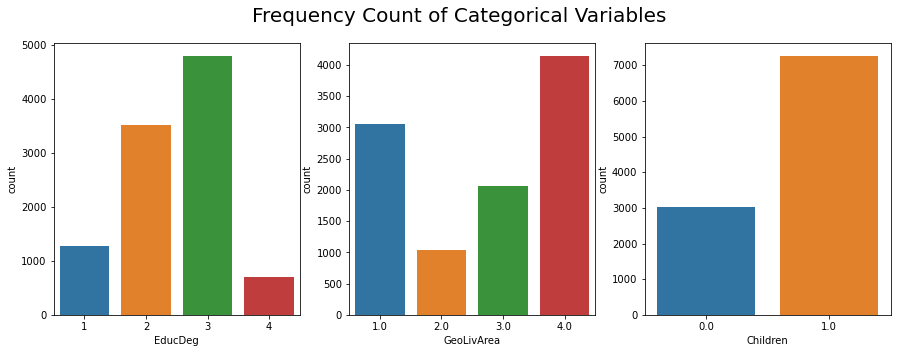

In [53]:
fig, ax = plt.subplots(1,3)
fig.suptitle('Frequency Count of Categorical Variables', fontsize = 20)

sns.countplot(df['EducDeg'], ax=ax[0], order=['1','2','3','4'])
sns.countplot(df['GeoLivArea'], ax=ax[1])
sns.countplot(df['Children'], ax=ax[2])

fig.show()

In [54]:
num_features= df.select_dtypes('float64')
num_features.set_index('CustID', inplace=True)
num_features

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,
1.0,1985.0,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...
10292.0,1984.0,3188.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10293.0,1977.0,2431.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10294.0,1994.0,2918.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


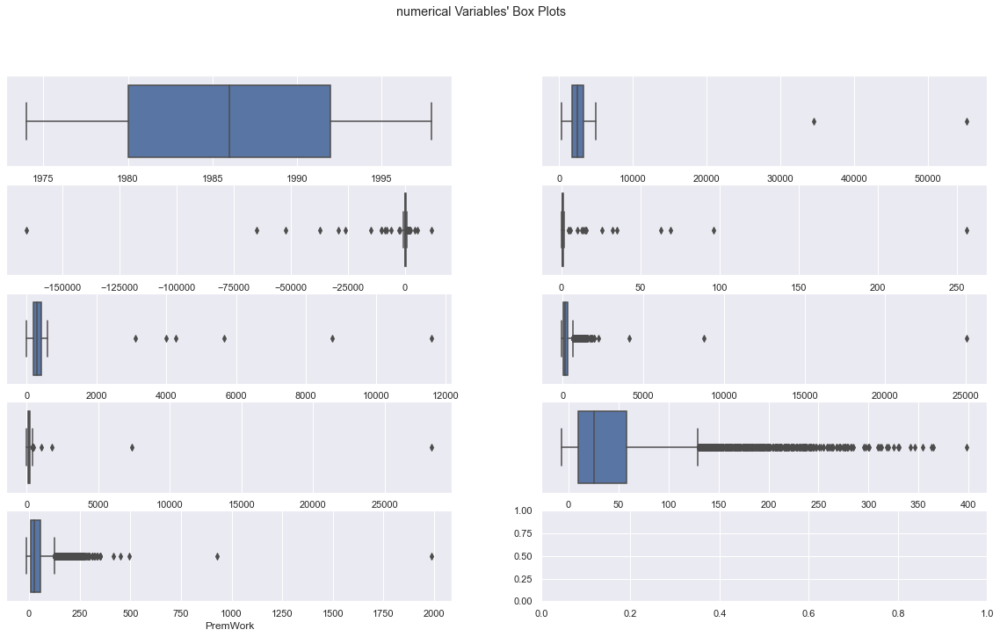

In [55]:
# All numerical Variables' Box Plots in one figure
sns.set()


# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(ceil(len(num_features.columns.to_list()) / 2), 2, figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), num_features.columns.to_list()): # Notice the zip() function and flatten() method
    sns.boxplot(x=df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "numerical Variables' Box Plots"

plt.suptitle(title)

#plt.savefig(os.path.join('..', 'figures', 'num_variables_boxplots.png'), dpi=200)
plt.show()

% of observations considered outliers: 2%
Number of observations considered outliers: 198


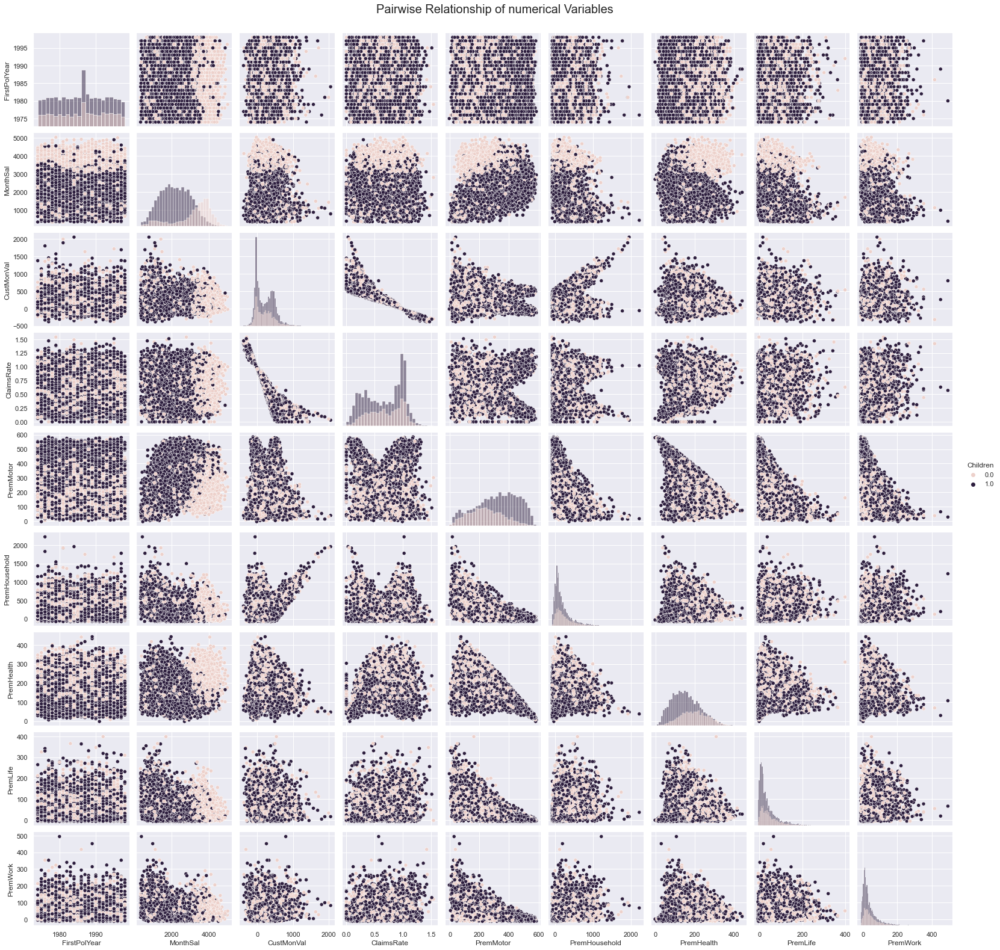

In [56]:
#  Arbitrary values set to rid of extreme outliers as automatic limitation, filtered only for better vizualization this step
filters=(
    (df['FirstPolYear']!=53784) &
    (df['MonthSal']<20000) &
    (df['CustMonVal']>-400) &
    (df['ClaimsRate']<50) &
    (df['PremMotor']<2500) &
    (df['PremHousehold']<3000) &
    (df['PremHealth']<3000) &
    (df['PremWork']<500)
)

visualization_num_var = df[filters]
print("% of observations considered outliers: {}%".format(int(round(1-visualization_num_var.shape[0]/df.shape[0],2)*100)))
print("Number of observations considered outliers: {}".format(len(df) - len(df[filters])))

# Pairwise Relationship of numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(visualization_num_var[num_features.columns.to_list()+['Children']], diag_kind="hist",hue='Children') # new_df variable removed for now

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of numerical Variables", fontsize=20)

plt.show()

# 3. Data Preparation  <a class="anchor" id="3"></a>

## 3.1 Data Cleaning  <a class="anchor" id="3.1"></a>

### 3.1.1 Impossible Values

In [57]:
# we drop thIS records for being impossible
df = df.loc[(df["FirstPolYear"] != 53784.0)]

### 3.1.2 Missing Values

In [58]:
df.isnull().sum()

CustID             0
FirstPolYear      30
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [59]:
premiums = ['PremLife','PremMotor','PremHousehold','PremHealth','PremWork']

# To store imputed CustID
tmp = df[df[premiums].isnull().any(axis=1)]
imp_prem_id = tmp['CustID']
len(imp_prem_id)

225

In [60]:
# As discussed in session 2.4, we treat nan values for premiums as zeros
df[premiums] = df[premiums].fillna(0)

In [61]:
df.isnull().sum()

CustID            0
FirstPolYear     30
EducDeg          17
MonthSal         36
GeoLivArea        1
Children         21
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

In [62]:
# these are some clients that don't have any insurance (all prem- values being nan/0 values) and CustMonVal == -25 which we believe to be the acquisition value
# in that sense we can't make a cluster with this obs because would't be representative enought, so we decided to drop it
df = df.loc[~((df.PremLife==0)&
               (df.PremMotor==0)&
               (df.PremHousehold==0)&
               (df.PremHealth==0)&
               (df.PremWork==0)
             )
          ]

In [63]:
# https://arxiv.org/ftp/arxiv/papers/1211/1211.1799.pdf#:~:text=The%20commonly%20used%20method%20for,of%20the%20attribute%20%5B5%5D.
# "The commonly used method for missing values imputation in categorical data is to substitute missing values of each attribute by the most common value of the attribute"
# i.e., mode
categorical = ['EducDeg','GeoLivArea','Children']

# To store imputed CustID
tmp = df[df[categorical].isnull().any(axis=1)]
imp_cat_id = tmp['CustID']
len(imp_cat_id)

38

In [64]:
# Impute categorical with mode
df[categorical] = df[categorical].fillna(df[categorical].mode().iloc[0])

In [65]:
df.isnull().sum()

CustID            0
FirstPolYear     30
EducDeg           0
MonthSal         36
GeoLivArea        0
Children          0
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

In [66]:
df['CustID'] = df['CustID'].astype(int)

In [67]:
df[['EducDeg','GeoLivArea','Children']] = df[['EducDeg','GeoLivArea','Children']].astype('object')

In [68]:
# There remains MonthSal and FirstPolYear (numerical) for missing values.
# We base the k (n_neighbors) value based on rule of thumb: sqrt(n), rounded to an odd number = 101
math.sqrt(len(df))

101.40019723846694

In [69]:
imputer = KNNImputer(n_neighbors=101)

In [70]:
# Prepare numerical features to be imputed
num_df = df.drop(categorical, axis=1)
num_df = num_df.set_index('CustID')

# KNN imputer for numerical variables (reference code)
# Standardization is not suited for distance-based classifier such as KNN. Hence normalization is used. We use min-max for this purpose.
minmax = MinMaxScaler()
num_df_minmax = pd.DataFrame(minmax.fit_transform(num_df), columns = num_df.columns)
imputed = pd.DataFrame(imputer.fit_transform(num_df_minmax), columns = num_df_minmax.columns)

In [71]:
imputed.isnull().sum()

FirstPolYear     0
MonthSal         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [72]:
imputed = minmax.inverse_transform(imputed)
imputed = pd.DataFrame(imputed)
imputed.columns = num_df.columns
imputed.FirstPolYear = imputed.FirstPolYear.astype(int)
imputed

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1985,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,1980,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,1991,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,1989,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,1986,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...
10277,1983,3188.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10278,1977,2431.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10279,1994,2918.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10280,1980,1971.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


In [73]:
# Not necessary, but add the CustID for later usaged.
imputed.insert(0, 'CustID',0)
imputed['CustID'] = df.reset_index()['CustID']

In [74]:
backup = df.copy()

In [75]:
backup.reset_index(inplace = True)

In [76]:
backup[['FirstPolYear','MonthSal']] = imputed[['FirstPolYear','MonthSal']]

In [77]:
backup.isnull().sum()

index            0
CustID           0
FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [78]:
backup.drop(columns= 'index', inplace = True)
backup

,CustID,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1,1985,2,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2,1980,2,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3,1991,1,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4,1989,3,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5,1986,3,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10277,10292,1983,4,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10278,10293,1977,1,2431.0,3.0,0.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10279,10294,1994,3,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10280,10295,1980,1,1971.0,2.0,1.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


In [79]:
df = backup.copy()

### 3.1.3 Data Normalization for outlier detection

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10282 entries, 0 to 10281
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10282 non-null  int32  
 1   FirstPolYear   10282 non-null  int32  
 2   EducDeg        10282 non-null  object 
 3   MonthSal       10282 non-null  float64
 4   GeoLivArea     10282 non-null  object 
 5   Children       10282 non-null  object 
 6   CustMonVal     10282 non-null  float64
 7   ClaimsRate     10282 non-null  float64
 8   PremMotor      10282 non-null  float64
 9   PremHousehold  10282 non-null  float64
 10  PremHealth     10282 non-null  float64
 11  PremLife       10282 non-null  float64
 12  PremWork       10282 non-null  float64
dtypes: float64(8), int32(2), object(3)
memory usage: 964.1+ KB


In [81]:
minmax = MinMaxScaler()
robust = RobustScaler()
yeojohnson = PowerTransformer('yeo-johnson')

num_features= df.select_dtypes('float64')

# transform data
scaled_minmax = minmax.fit_transform(num_features)
scaled_robust = robust.fit_transform(num_features)
scaled_yeojohn = yeojohnson.fit_transform(num_features)

# Concatenate the results to be visualized
normal_res = np.concatenate((scaled_minmax, scaled_robust, scaled_yeojohn), axis=1)
labels = list(map(lambda x: "minmax_" + x, num_features.columns.to_list())) + list(map(lambda x: "robust_" + x, num_features.columns.to_list())) + list(map(lambda x: "yeojohn_" + x, num_features.columns.to_list()))
normal_res_df = pd.DataFrame(normal_res, num_features.index, labels)
normal_res_df.head()

,minmax_MonthSal,minmax_CustMonVal,minmax_ClaimsRate,minmax_PremMotor,minmax_PremHousehold,minmax_PremHealth,minmax_PremLife,minmax_PremWork,robust_MonthSal,robust_CustMonVal,...,robust_PremLife,robust_PremWork,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
0,0.033599,0.935260,0.001522,0.032731,0.006148,0.005251,0.133259,0.014440,-0.206962,0.473455,...,0.457555,-0.188437,-0.208262,0.373110,-0.802584,0.579275,-0.323080,-0.098913,0.395210,-0.340394
1,0.006268,0.932376,0.004372,0.007027,0.019551,0.004202,0.497113,0.059044,-1.156329,-0.778126,...,3.587224,1.751141,-2.164826,-0.673247,1.152632,-1.657409,0.849026,-0.501714,2.376498,1.339238
2,0.035421,0.935957,0.001093,0.018113,0.011921,0.004481,0.230323,0.055491,-0.143671,0.775780,...,1.292445,1.596609,-0.108828,0.739361,-1.239652,-0.472750,0.240085,-0.388233,1.072008,1.236246
3,0.013957,0.933019,0.003864,0.016074,0.004711,0.011080,0.104466,0.020163,-0.889241,-0.499166,...,0.209890,0.060422,-1.483907,-0.601578,0.887313,-0.652151,-0.498403,1.460896,0.143842,-0.039137
4,0.026056,0.933313,0.003513,0.029524,0.004888,0.006532,0.063607,0.026716,-0.468987,-0.371539,...,-0.141553,0.345360,-0.647551,-0.523969,0.687413,0.374418,-0.475195,0.322091,-0.295992,0.251891


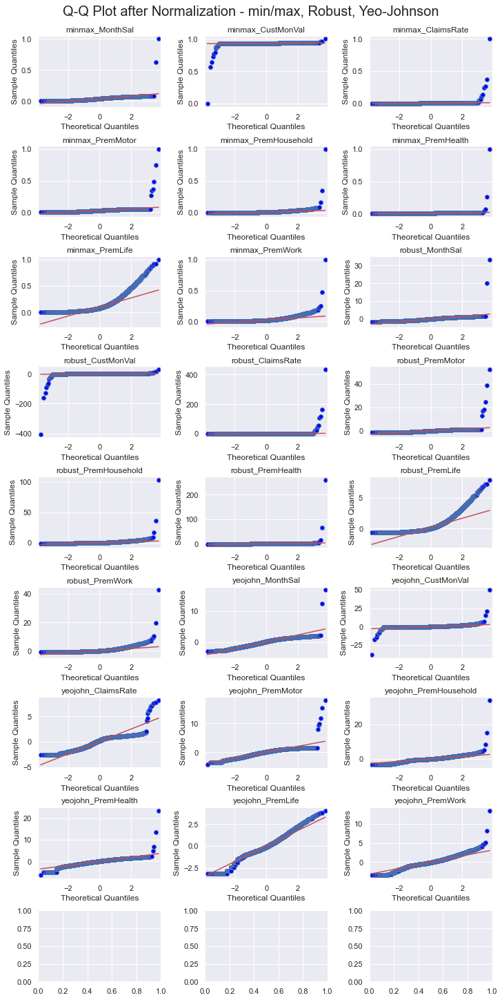

In [82]:
# Plot transformed data
sns.set()
fig, axes = plt.subplots(9,3, constrained_layout = True, figsize = (10,20))

fig.suptitle("Q-Q Plot after Normalization - min/max, Robust, Yeo-Johnson", fontsize = 20)
for c, ax in zip(normal_res_df.columns, axes.flatten()):
    x = normal_res_df.loc[:,c]
    sm.qqplot(x, line = "q", ax = ax)
    ax.set_title(c)

plt.show()

In [83]:
# We will only use yeo-johnson as the results most consistly produced normal distribution spread (esepcially prem life)
scaled_yj_df = normal_res_df.loc[:,[i for i in normal_res_df.columns.to_list() if "yeojohn" in i]]
scaled_yj_df.head()

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
0,-0.208262,0.373110,-0.802584,0.579275,-0.323080,-0.098913,0.395210,-0.340394
1,-2.164826,-0.673247,1.152632,-1.657409,0.849026,-0.501714,2.376498,1.339238
2,-0.108828,0.739361,-1.239652,-0.472750,0.240085,-0.388233,1.072008,1.236246
3,-1.483907,-0.601578,0.887313,-0.652151,-0.498403,1.460896,0.143842,-0.039137
4,-0.647551,-0.523969,0.687413,0.374418,-0.475195,0.322091,-0.295992,0.251891


In [84]:
scaled_yj_df.columns

Index(['yeojohn_MonthSal', 'yeojohn_CustMonVal', 'yeojohn_ClaimsRate',
       'yeojohn_PremMotor', 'yeojohn_PremHousehold', 'yeojohn_PremHealth',
       'yeojohn_PremLife', 'yeojohn_PremWork'],
      dtype='object')

In [85]:
scaled_yj_df.insert(0, 'CustID',0)
scaled_yj_df['CustID'] = df['CustID']

In [86]:
scaled_yj_df.set_index('CustID',inplace=True)

### 3.1.4 Outliers Treatment

### Univariate
#### IQR method

In [87]:
#outlier removal using IQR method
q25 = scaled_yj_df.quantile(.25)
q75 = scaled_yj_df.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
num_var = scaled_yj_df.columns.to_list()
for numerical in num_var:
    llim = lower_lim[numerical]
    ulim = upper_lim[numerical]
    filters.append(scaled_yj_df[numerical].between(llim, ulim, inclusive=True))

df_iqr = scaled_yj_df[np.all(filters, 0)]
print('Number of outliers:', (scaled_yj_df.shape[0] - df_iqr.shape[0]))
print('Percentage of data kept after removing outliers:', (np.round(df_iqr.shape[0] / scaled_yj_df.shape[0], 3))*100)
#df = df.loc[df_iqr.index]

Number of outliers: 1575
Percentage of data kept after removing outliers: 84.7


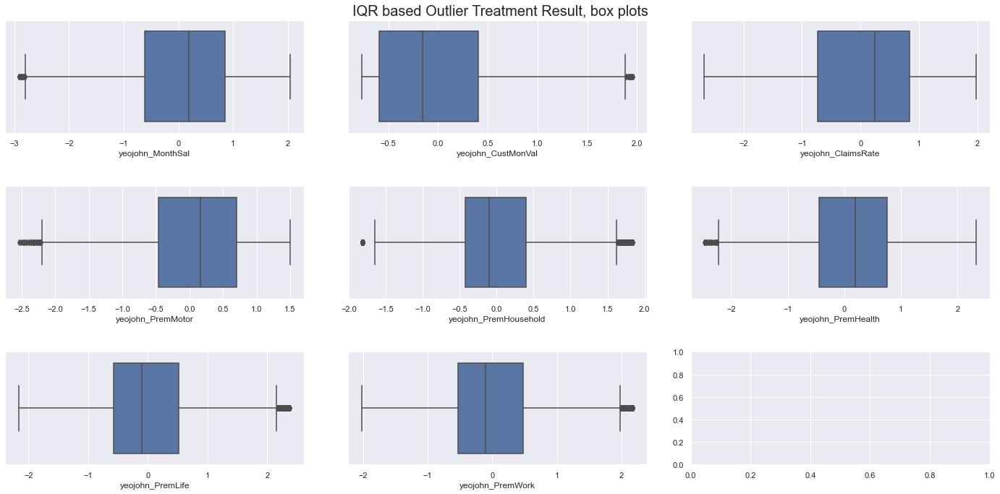

In [88]:
# All numerical Variables' Box Plots in one figure
sns.set()


# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, 3, figsize=(20, 10))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), df_iqr.columns.to_list()): # Notice the zip() function and flatten() method
    sns.boxplot(x=df_iqr[feat], ax=ax)
    
# Layout
plt.tight_layout(pad=3)
plt.suptitle('IQR based Outlier Treatment Result, box plots', fontsize = 20)
plt.show()

**z-scores**

In [89]:
z_scores = stats.zscore(scaled_yj_df)

abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)

df_zscore = scaled_yj_df[filtered_entries]
print('Number of outliers:', (scaled_yj_df.shape[0] - df_zscore.shape[0]))
print('Percentage of data kept after removing outliers:', np.round(df_zscore.shape[0] / scaled_yj_df.shape[0], 3)*100)

Number of outliers: 431
Percentage of data kept after removing outliers: 95.8


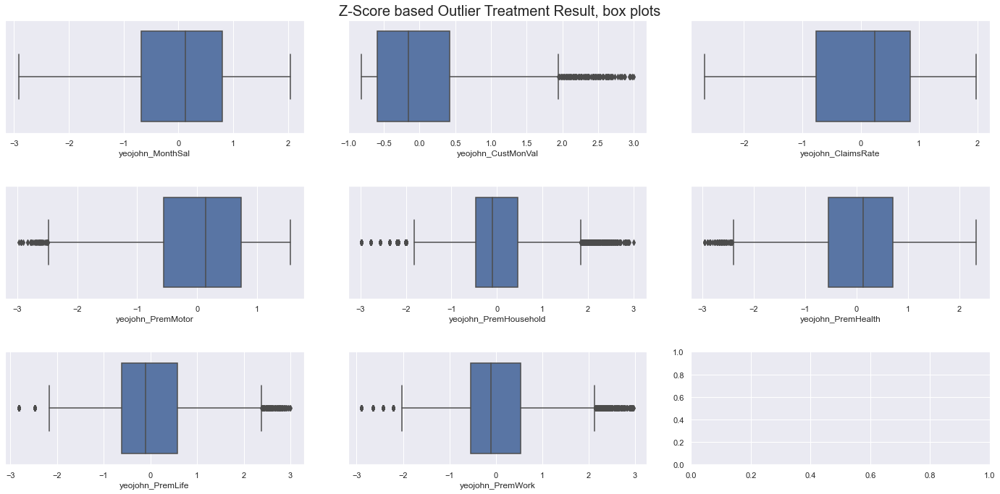

In [90]:
# All numerical Variables' Box Plots in one figure
sns.set()


# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, 3, figsize=(20, 10))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), df_zscore.columns.to_list()): # Notice the zip() function and flatten() method
    sns.boxplot(x=df_zscore[feat], ax=ax)
    
# Layout
plt.tight_layout(pad=3)
plt.suptitle('Z-Score based Outlier Treatment Result, box plots', fontsize = 20)
plt.show()

**Median Absolute Deviation**

Theoretical support:
https://www.sciencedirect.com/science/article/abs/pii/S0022103113000668

In [91]:
# https://towardsdatascience.com/detecting-and-treating-outliers-in-python-part-1-4ece5098b755

def mad_method(df, variable_name, thresh = 2.5): # using conservative threshold (default = 3, 'poorly conservative' = 2)
    #Takes two parameters: dataframe & variable of interest as string
    columns = df.columns
    med = np.median(df, axis = 0)
    mad = np.abs(stats.median_absolute_deviation(df))
    threshold = thresh
    outlier = []
    index = 0
    for item in range(len(columns)):
        if columns[item] == variable_name:
            index == item
    for i, v in enumerate(df.loc[:,variable_name]):
        t = (v-med[index])/mad[index]
        if t > threshold:
            outlier.append(i)
        else:
            continue
    return outlier

In [92]:
# Be mindful FirstPolYear obviously shouldn't have any "outlier"
mad_out_list = []
# List to check customers that appear more than once
mad_out_list2 = []
for c in scaled_yj_df.columns:
    out_idx = mad_method(scaled_yj_df, c)
    print(f'-----{c}-----')
    print('Number of outliers:', len(out_idx))
    print('The index of outliers:', out_idx)
    for i in out_idx:
        mad_out_list.append(i) if i not in mad_out_list else mad_out_list
        mad_out_list2.append(i)
print('------------------------------------------------------------------')
print('Total number of outliers:', len(mad_out_list))

-----yeojohn_MonthSal-----
Number of outliers: 2
The index of outliers: [5876, 8251]
-----yeojohn_CustMonVal-----
Number of outliers: 49
The index of outliers: [265, 301, 628, 649, 851, 907, 1186, 1192, 1469, 1857, 1999, 2041, 2321, 2528, 2783, 2885, 3489, 3564, 3659, 3896, 4367, 4410, 4742, 4813, 5078, 5287, 6692, 6733, 6849, 7076, 7157, 7591, 7951, 8165, 8216, 8356, 8580, 8656, 8745, 8783, 8951, 9224, 9244, 9544, 9549, 9761, 9783, 10117, 10278]
-----yeojohn_ClaimsRate-----
Number of outliers: 15
The index of outliers: [51, 112, 135, 171, 655, 675, 707, 758, 793, 916, 950, 981, 1024, 7952, 9635]
-----yeojohn_PremMotor-----
Number of outliers: 6
The index of outliers: [5122, 5205, 5287, 6692, 7076, 7894]
-----yeojohn_PremHousehold-----
Number of outliers: 43
The index of outliers: [475, 763, 1068, 1551, 1743, 1857, 2041, 2321, 2528, 2543, 2783, 3080, 3373, 3489, 3534, 3659, 3689, 3896, 4367, 4459, 4742, 5637, 5923, 6122, 6164, 6336, 6541, 6661, 6733, 6826, 6849, 7157, 8356, 8415, 8533,

In [93]:
1- 223/len(scaled_yj_df)

0.9783116125267458

In [94]:
mad_out_df = scaled_yj_df.iloc[mad_out_list]
mad_out_df

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
CustID,,,,,,,,
5883,16.814695,-0.326453,0.422293,0.037597,-0.041580,-0.305234,1.043487,0.724736
8262,12.442545,1.058845,-1.239652,-1.928076,0.676719,0.455491,1.456300,2.059498
266,-1.814412,2.869874,-2.671813,-0.801559,1.699139,-0.038133,0.758244,0.891695
302,-0.958750,3.548821,-2.373320,-2.173939,2.574228,-1.320571,1.286833,1.924454
629,-1.679460,3.871552,-2.671813,-2.239780,2.608710,0.170725,-1.875229,2.115717
...,...,...,...,...,...,...,...,...
9515,-1.971688,1.775578,-2.259990,-2.896265,0.811063,-1.423560,2.305224,3.122727
9602,0.397990,0.526829,-0.955146,-0.531288,0.009405,-1.180375,-0.656761,3.143869
9677,-2.613791,0.523523,-0.765498,-1.215564,0.161968,-1.887991,1.798678,3.092548


In [95]:
# Reference. If there is at least one outlier identified, at least the min or the max value should be there in the list of outliers for the feature.
scaled_yj_df.describe().loc[['min','max']]

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
min,-2.914590,-38.085543,-2.671813,-4.323278,-3.401896,-6.327575,-3.183343,-3.391983
max,16.814695,49.621239,8.176911,17.872138,33.739546,23.616976,4.074478,13.515317


In [96]:
# Check a few
# FirstPolYear value
scaled_yj_df.iloc[5876]

yeojohn_MonthSal         16.814695
yeojohn_CustMonVal       -0.326453
yeojohn_ClaimsRate        0.422293
yeojohn_PremMotor         0.037597
yeojohn_PremHousehold    -0.041580
yeojohn_PremHealth       -0.305234
yeojohn_PremLife          1.043487
yeojohn_PremWork          0.724736
Name: 5883, dtype: float64

In [97]:
# Check a few
# Motor
scaled_yj_df.iloc[[5122, 5205, 5287, 6692, 7076, 7894]]

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
CustID,,,,,,,,
5129,1.163079,0.623857,0.687413,9.353004,1.400142,-0.214574,1.558108,0.031421
5212,1.437973,-0.307103,0.887313,15.174596,-0.225628,6.739292,1.957558,1.674174
5294,1.010218,49.621239,-2.149884,17.872138,-0.469544,4.845024,1.312965,3.496571
6702,0.505799,15.127880,-2.490031,9.761414,-0.303082,-0.678025,-0.972055,-0.811805
7086,0.067438,20.535727,-2.610294,11.652040,-1.480552,-1.808949,-1.054296,-0.920135
7905,-0.033798,-0.622524,0.929849,7.880539,-0.572079,-1.557926,-0.495770,-0.597208


In [98]:
# mad_out_list is the index i.e., the order from the top. We excluded items, so iloc won't match the actual values of CustID.
# Hence, this fix.
mad_CustID = mad_out_df.index.tolist()
df_mad = scaled_yj_df[~scaled_yj_df.index.isin(mad_CustID)]
df_mad

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
CustID,,,,,,,,
1,-0.208262,0.373110,-0.802584,0.579275,-0.323080,-0.098913,0.395210,-0.340394
2,-2.164826,-0.673247,1.152632,-1.657409,0.849026,-0.501714,2.376498,1.339238
3,-0.108828,0.739361,-1.239652,-0.472750,0.240085,-0.388233,1.072008,1.236246
4,-1.483907,-0.601578,0.887313,-0.652151,-0.498403,1.460896,0.143842,-0.039137
5,-0.647551,-0.523969,0.687413,0.374418,-0.475195,0.322091,-0.295992,0.251891
...,...,...,...,...,...,...,...,...
10291,-2.260731,-0.190707,0.569922,-3.005558,2.075990,-0.709876,1.446051,2.523619
10292,0.708798,-0.586937,0.822256,0.673912,-0.466731,0.225819,-0.618504,-0.403624
10294,0.480800,0.798227,-1.549238,0.725259,-0.098130,-0.151100,-0.503975,-0.764526


In [99]:
# Checks to show the customer was excluded.
df_mad.loc[5882:5884]

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
CustID,,,,,,,,
5882,-0.452755,0.702121,-1.413257,0.451561,-0.158538,0.078147,-2.816629,0.481571
5884,0.625567,-0.624697,0.992444,0.412576,-1.319683,0.669256,-0.744098,-0.369966


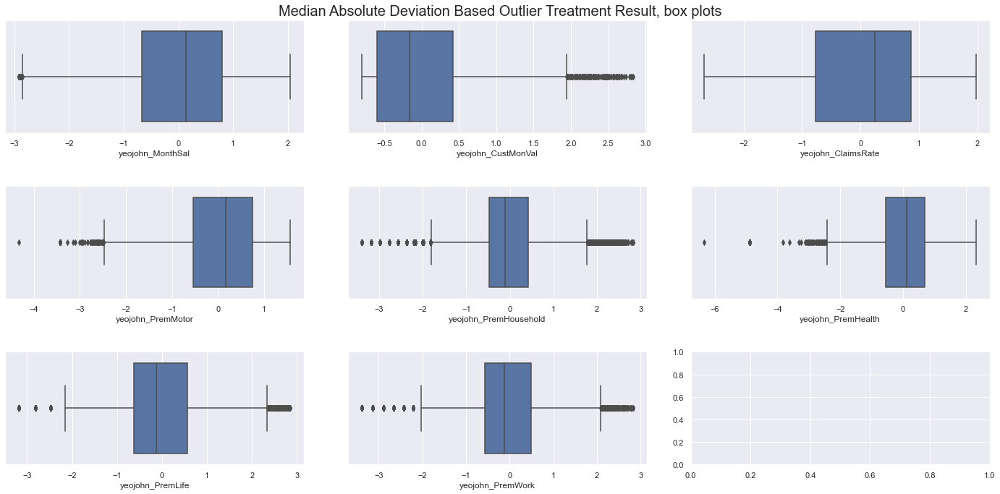

In [100]:
# All numerical Variables' Box Plots in one figure
sns.set()


# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, 3, figsize=(20, 10))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), df_mad.columns.to_list()): # Notice the zip() function and flatten() method
    sns.boxplot(x=df_mad[feat], ax=ax)
    
# Layout
plt.tight_layout(pad=3)
plt.suptitle('Median Absolute Deviation Based Outlier Treatment Result, box plots', fontsize = 20)
plt.show()

- We decide on median absolute deviation, move on to check multivariate 

### Multivariate
#### DBSCAN
How to choose the parameter for DBSCAN:
- Min points: If the data has more than 2 dimensions, choose MinPts = 2*dim,
where dim= the dimensions of your data set (Sander et al., 1998).
-Calculate the average distance between each point and its k nearest neighbors, where k = the MinPts value you selected. The average k-distances are then plotted in ascending order on a k-distance graph. You’ll find the optimal value for ε at the point of maximum curvature (i.e. where the graph has the greatest slope).

In [101]:
math.sqrt(len(df_mad))

100.29456615390487

In [102]:
#Calculate the average distance between each point in the data set and its 20 nearest neighbors
neighbors = NearestNeighbors(n_neighbors=101)
neighbors_fit = neighbors.fit(df_mad)
distances, indices = neighbors_fit.kneighbors(df_mad)

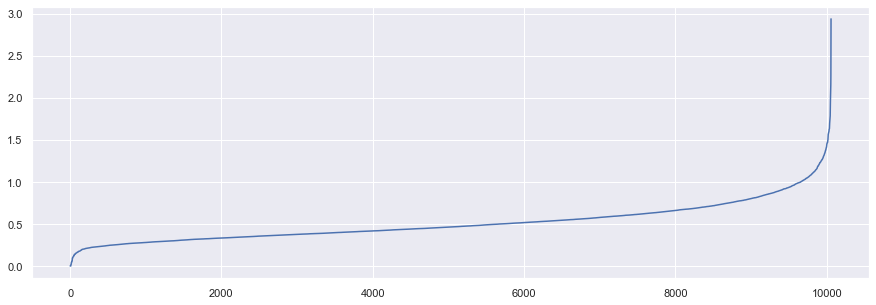

In [103]:
#Sort distance values by ascending value and plot
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

#the elbow values (distance on the y axis gives us the best value for eps)

In [104]:
model = DBSCAN(eps = 2, min_samples = 18).fit(df_mad)

#converting the array into dataframe to group by labels and check the counts

labels = model.labels_
labels_df =  pd.DataFrame(labels, columns=['cluster'])
labels_df['cluster'].value_counts()

#-1 label corresponds to the outliers

 0    10007
-1       52
Name: cluster, dtype: int64

#### Connectivity Outlier Factor (COF)

In [105]:
cof = COF()
cof.fit(df_mad)
#Using predict method for identifying outliers
predict_cof = cof.predict(df_mad)

print('Number of outliers:',  np.round((len(df_mad) - len(predict_cof)), 2)*100)
print('Percentage of data kept after removing outliers:',  np.round(((len(predict_cof) / len(df_mad))), 2)*100)

Number of outliers: 0
Percentage of data kept after removing outliers: 100.0


In [106]:
len(df_mad)

10059

In [107]:
# Malhalanobis
# https://towardsdatascience.com/multivariate-outlier-detection-in-python-e946cfc843b3
# https://towardsdatascience.com/detecting-and-treating-outliers-in-python-part-2-3a3319ec2c33

#Mahalonibis Distance
def mahalanobis_method(df):
    #M-Distance
    x_minus_mu = df - np.mean(df)
    cov = np.cov(df.values.T)                           #Covariance
    inv_covmat = sp.linalg.inv(cov)                     #Inverse covariance
    left_term = np.dot(x_minus_mu, inv_covmat) 
    mahal = np.dot(left_term, x_minus_mu.T)
    md = np.sqrt(mahal.diagonal())
    
    #Flag as outlier
    outlier = []
    #Cut-off point
    C = np.sqrt(chi2.ppf((1-0.001), df=df.shape[1]))    #degrees of freedom = number of variables
    for index, value in enumerate(md):
        if value > C:
            outlier.append(index)
        else:
            continue
    return outlier, md

In [108]:
outliers_mahal, md = mahalanobis_method(df_mad)
len(outliers_mahal)

312

In [109]:
df_mahal = df_mad[~df_mad.index.isin(outliers_mahal)]
df_mahal

,yeojohn_MonthSal,yeojohn_CustMonVal,yeojohn_ClaimsRate,yeojohn_PremMotor,yeojohn_PremHousehold,yeojohn_PremHealth,yeojohn_PremLife,yeojohn_PremWork
CustID,,,,,,,,
1,-0.208262,0.373110,-0.802584,0.579275,-0.323080,-0.098913,0.395210,-0.340394
2,-2.164826,-0.673247,1.152632,-1.657409,0.849026,-0.501714,2.376498,1.339238
3,-0.108828,0.739361,-1.239652,-0.472750,0.240085,-0.388233,1.072008,1.236246
4,-1.483907,-0.601578,0.887313,-0.652151,-0.498403,1.460896,0.143842,-0.039137
5,-0.647551,-0.523969,0.687413,0.374418,-0.475195,0.322091,-0.295992,0.251891
...,...,...,...,...,...,...,...,...
10291,-2.260731,-0.190707,0.569922,-3.005558,2.075990,-0.709876,1.446051,2.523619
10292,0.708798,-0.586937,0.822256,0.673912,-0.466731,0.225819,-0.618504,-0.403624
10294,0.480800,0.798227,-1.549238,0.725259,-0.098130,-0.151100,-0.503975,-0.764526


In [110]:
# The ratio of the data remaining after data cleaning
print('Number of outliers:', (len(df_mad)-len(df_mahal)))
print('Percentage of data kept after removing outliers:', np.round(len(df_mahal) / len(df_mad), 3)*100)

Number of outliers: 305
Percentage of data kept after removing outliers: 97.0


In [111]:
norm_cleaned_data_CustID = df_mahal.index.tolist()
cleaned_data = df[df.CustID.isin(norm_cleaned_data_CustID)]

In [112]:
cleaned_data.set_index('CustID',inplace=True)
cleaned_data

,FirstPolYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,
1,1985,2,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1980,2,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991,1,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1989,3,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986,3,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...
10291,1994,1,626.0,3.0,1.0,176.26,0.85,6.89,878.50,103.13,113.02,201.26
10292,1983,4,3188.0,2.0,0.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10294,1994,3,2918.0,1.0,1.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89


In [113]:
# Final data was based on Median Absolute Deviation (univariate) + Mahalanobis (Multivariate)

## 3.2 Data Construction  <a class="anchor" id="3.2"></a>

In [114]:
# First thing we noticed was the discrepancy among the timeframes of the features.
# 1. Salary is monthly based
# 2. CustMonVal is lifetime based
# 3. Premiums are yearly based
# Since most of the variables (premiums) are yearly based, we turn the other two variables to be yearly.

# Salary
cleaned_data['YearlySal'] = cleaned_data['MonthSal']*12
cleaned_data['YearlySal'] = cleaned_data['YearlySal'].round(decimals = 1) # based on the original variable 


# CustMonVal
# First find years as customer
cleaned_data['YearsAsCust'] = 2016 - cleaned_data['FirstPolYear']
# cleaned_data.drop('YearsAsCust', inplace = True)

# Divide by the year to find the average yearly customer monetary value.
cleaned_data['AvgCustMonVal'] = cleaned_data['CustMonVal'] / cleaned_data['YearsAsCust']
cleaned_data['AvgCustMonVal'] = cleaned_data['AvgCustMonVal'].round(decimals = 2) # Currency, and the original variable had 2 decimal places

# Note, we suspect acquisition cost to be 25 as previously discussed, but we are not sure if that's the case for everyone. 
# Hence, the new customer monetary value (yearly) variable is only an approximate.

In [115]:
# We are believe the understanding of the total yearly commitment 
cleaned_data['totalPremium'] = cleaned_data['PremMotor'] + cleaned_data['PremHousehold'] + cleaned_data['PremHealth'] + cleaned_data['PremLife'] + cleaned_data['PremWork'] 

In [116]:
# The total premium would show how much revenue the customer is bringing to us (in 2016), which is more focused on the business.
# We believe the below variables would allow us to study more focused on the customer's perspective

# How much of the salary did the customer commit to our insurance coverage?
cleaned_data['SalPremRatio'] = cleaned_data['totalPremium'] / cleaned_data['YearlySal']
cleaned_data['SalPremRatio'] = cleaned_data['SalPremRatio'].round(decimals = 4)

# What is the customer most concerned about?
cleaned_data['%PremMotor']     = cleaned_data['PremMotor'] / cleaned_data['totalPremium']
cleaned_data['%PremHousehold'] = cleaned_data['PremHousehold'] / cleaned_data['totalPremium']
cleaned_data['%PremHealth']    = cleaned_data['PremHealth'] / cleaned_data['totalPremium']
cleaned_data['%PremLife']      = cleaned_data['PremLife'] / cleaned_data['totalPremium']
cleaned_data['%PremWork']      = cleaned_data['PremWork'] / cleaned_data['totalPremium']

## 3.3 Data Seleting  <a class="anchor" id="3.3"></a>

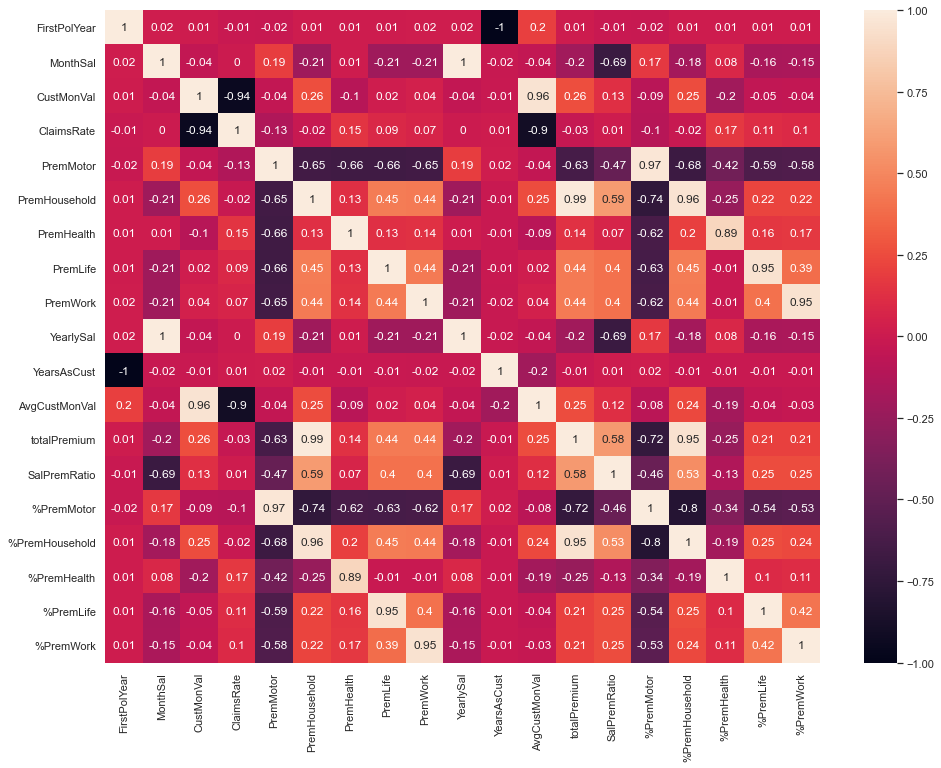

In [117]:
# Prepare figure
fig = plt.figure(figsize=(16,12))

corrMatrix = round(cleaned_data.corr(),2)
sns.heatmap(corrMatrix, annot=True)
plt.show()

Higly correlated variables:
- CustMonVal (ou AvgCustMonVal) vs ClaimsRate (-0.89) ---> Drop ClaimsRate (Easier to interprete clusters with montly salary)
- FirstPolYear vs YearsAsCust (-1) ---> Drop FirstPolYear ((Easier to interprete clusters with YearsAsCust)
- %PremMotor vs %PremHousehold (-0.88) ---> Consider keeping both, but %PremHousehold has a higher discriminative power
- Premiums vs %Premiums all higly correlated  ---> choose only the percentages

In [118]:
norm_cleaned_data = cleaned_data.copy()

considered_df_all_Pct_prem = norm_cleaned_data[[ 'EducDeg',
                                                 'Children',
                                                 'GeoLivArea',
                                                 'YearsAsCust',
                                                 'YearlySal',
                                                 'SalPremRatio',
                                                 'AvgCustMonVal',
                                                 '%PremMotor',
                                                 '%PremHousehold',
                                                 '%PremHealth',
                                                 '%PremLife',
                                                 '%PremWork']]


considered_df_CustBackground = norm_cleaned_data[['EducDeg',
                                            'Children',
                                            'GeoLivArea',
                                            'YearsAsCust',
                                            'YearlySal',
                                            'SalPremRatio',
                                            'AvgCustMonVal']]

#Kmeans 
considered_df_InsuranceInfo = norm_cleaned_data[[
                                                 '%PremMotor',
                                                 '%PremHousehold',
                                                 '%PremHealth',
                                                 '%PremLife',
                                                 '%PremWork']]
    
numerical_var_kmeans = norm_cleaned_data[['YearlySal',
                                          'AvgCustMonVal',
                                          'YearsAsCust',
                                          'SalPremRatio',
                                          '%PremMotor',
                                          '%PremHousehold',
                                          '%PremHealth',
                                          '%PremLife',
                                          '%PremWork']]


## 4 Clustring  <a class="anchor" id="4"></a>
## 4.1 KMEANS + Hierarchical Clustering <a class="anchor" id="4.1"></a>

In [119]:
def inertiaPlot(df):
    inertia = []
    for n_clus in range(1,20):  # iterate over desired ncluster range
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(df)
        inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

    # The inertia plot
    plt.figure(figsize=(9,5))
    plt.plot(inertia)
    plt.ylabel("Inertia: SSw")
    plt.xlabel("Number of clusters")
    plt.title("Inertia plot over clusters", size=15)
    plt.show()

In [120]:
#https://www.python-graph-gallery.com/web-radar-chart-with-matplotlib
def Radar_Graph(df,name_clusters,title):
    BG_WHITE = "#fbf9f4"
    BLUE = "#2a475e"
    GREY70 = "#b3b3b3"
    GREY_LIGHT = "#f2efe8"
    COLORS = ["#FF5A5F", "#FFB400", "#007A87","#1B1725","#534B62","#CFFFB0"]
 
    def rescale(x):
        return (x - np.min(x)) / np.ptp(x)
 
    radar = df.apply(lambda x: rescale(x)).reset_index()
 
    # The cluesters
    SPECIES = df.index.values.tolist()
 
    # The four variables in the plot
    VARIABLES = radar.columns.tolist()[1:]
    VARIABLES_N = len(VARIABLES)
 
    # The angles at which the values of the numeric variables are placed
    ANGLES = [n / VARIABLES_N * 2 * np.pi for n in range(VARIABLES_N)]
    ANGLES += ANGLES[:1]
 
    # Padding used to customize the location of the tick labels
    X_VERTICAL_TICK_PADDING = 5
    X_HORIZONTAL_TICK_PADDING = 50    
 
    # Angle values going from 0 to 2*pi
    HANGLES = np.linspace(0, 2 * np.pi)
 
    # Used for the equivalent of horizontal lines in cartesian coordinates plots 
    # The last one is also used to add a fill which acts a background color.
    H0 = np.zeros(len(HANGLES))
    H1 = np.ones(len(HANGLES)) * 0.5
    H2 = np.ones(len(HANGLES))
 
    

    # Initialize layout ----------------------------------------------
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, polar=True)
 
    # Rotate the "" 0 degrees on top. 
    # There it where the first variable, will go.
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
 
    # Setting lower limit to negative value reduces overlap
    # for values that are 0 (the minimums)
    ax.set_ylim(-0.1, 1.05)
 
    # Plot lines and dots --------------------------------------------
    for idx, species in enumerate(SPECIES):
        values = radar.iloc[idx].drop("Cluster").values.tolist()
        values += values[:1]
        ax.plot(ANGLES, values, c=COLORS[idx], linewidth=4, label=species)
        ax.scatter(ANGLES, values, s=160, c=COLORS[idx], zorder=10)
 

    # Now fill the area of the circle with radius 1.
    # This create the effect of gray background.
    #ax.fill(HANGLES, H2, GREY_LIGHT)
    ax.set_facecolor(GREY_LIGHT)

    # Set values for the angular axis (x)
    ax.set_xticks(ANGLES[:-1])
    ax.set_xticklabels(VARIABLES, size=14)
 
    # Remove lines for radial axis (y)
    ax.set_yticks([])
    ax.yaxis.grid(False)
    ax.xaxis.grid(False)
 
    # Remove spines
    ax.spines["start"].set_color("none")
    ax.spines["polar"].set_color("none")
 
    # Add custom lines for radial axis (y) at 0, 0.5 and 1.
    ax.plot(HANGLES, H0, ls=(0, (6, 6)), c=GREY70)
    ax.plot(HANGLES, H1, ls=(0, (6, 6)), c=COLORS[2])
    ax.plot(HANGLES, H2, ls=(0, (6, 6)), c=GREY70)
 
    # Custom guides for angular axis (x).
    # These four lines do not cross the y = 0 value, so they go from 
    # the innermost circle, to the outermost circle with radius 1.
    ax.plot([0, 0], [0, 1], lw=2, c=GREY70)
    ax.plot([np.pi, np.pi], [0, 1], lw=2, c=GREY70)
    ax.plot([np.pi / 2, np.pi / 2], [0, 1], lw=2, c=GREY70)
    ax.plot([-np.pi / 2, -np.pi / 2], [0, 1], lw=2, c=GREY70)
 
    # Add levels -----------------------------------------------------
    # These labels indicate the values of the radial axis
    PAD = 0.05
    ax.text(-0.4, 0 + PAD, "0%", size=16, fontname="Roboto")
    ax.text(-0.4, 0.5 + PAD, "50%", size=16, fontname="Roboto")
    ax.text(-0.4, 1 + PAD, "100%", size=16, fontname="Roboto")
 

    # Create and add legends -----------------------------------------
    # Legends are made from scratch.
 
    # Iterate through species names and colors.
    # These handles contain both markers and lines.
    handles = [
        Line2D(
            [], [], 
            c=color, 
            lw=3, 
            marker="o", 
            markersize=8, 
            label=species
        )
        for species, color in zip(name_clusters, COLORS)
    ]
 
    legend = ax.legend(
        handles=handles,
        loc=(1, -0.2),       # bottom-right
        labelspacing=1.5, # add space between labels
        frameon=False     # don't put a frame
    )
 
    # Iterate through text elements and change their properties
    for text in legend.get_texts():
        text.set_fontname("Roboto") # Change default font 
        text.set_fontsize(16)       # Change default font size
 
    # Adjust tick label positions ------------------------------------
    XTICKS = ax.xaxis.get_major_ticks()
    for tick in XTICKS[0::2]:
        tick.set_pad(X_VERTICAL_TICK_PADDING)
 
    for tick in XTICKS[1::2]:
        tick.set_pad(X_HORIZONTAL_TICK_PADDING)
 
    # Add title ------------------------------------------------------
    fig.suptitle(
        title,
        ha='center',
        fontsize=32,
        fontname="Lobster Two",
        color=BLUE,
        weight="bold",    
    )

In [121]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py
def silhouette(df,kmclust,range_clusters):

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20,11))
    for ax, nclus in zip(axes.flatten(), range_clusters):

        # Storing average silhouette metric
        avg_silhouette = []
        kmclust = kmclust.set_params(**{'n_clusters':nclus})
        cluster_labels = kmclust.fit_predict(df)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(df, cluster_labels)
        avg_silhouette.append(silhouette_avg)
        print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")
 
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(df, cluster_labels)
 
        y_lower = 10
        for i in range(nclus):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
 
            # Get y_upper to demarcate silhouette y range size
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
 
            # Filling the silhouette
            color = cm.nipy_spectral(float(i) / nclus)
            ax.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)
 
            # Label the silhouette plots with their cluster numbers at the middle
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
 
            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax.set_title("{} Clusters".format(nclus), fontsize=13)
        ax.set_xlabel("Silhouette Coefficients")
        ax.set_ylabel("Cluster Labels")
        ax.axvline(x=silhouette_avg, color="red", linestyle="--", label="Average Silhouette") 
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ["Average Silhouette = {0:.2f}".format(silhouette_avg)])

    plt.subplots_adjust(hspace=0.35)
    plt.suptitle(("Clustering Silhouette Plots"), fontsize=25, fontweight='bold')
    plt.show()

In [122]:
def kmeans_Hierarchical(df,threshold=0.4):
    
    considered_df = df.copy()
    pt = PowerTransformer('yeo-johnson') # Yeo-Johnson by default, but specified to avoid confusion
    considered_df[considered_df.columns] = pt.fit_transform(np.array(considered_df))
    
    kmeans = KMeans(n_clusters=100, random_state=0).fit(considered_df)
    considered_df['Cluster'] = pd.Series(kmeans.labels_,index=considered_df.index)
    kmeans_clusters = considered_df.groupby("Cluster").mean()
    considered_df.drop("Cluster", axis = 1, inplace = True)
    
    
    # Hierarchical clustering assessment using scipy
    Z = linkage(kmeans_clusters, method='ward')
    sns.set()
    fig = plt.figure(figsize=(15,7))

    
    
    # Dendrogram
    set_link_color_palette(list(sns.color_palette().as_hex()))
    dendrogram(Z, color_threshold = threshold*max(Z[:,2]), orientation='top', no_labels=True, above_threshold_color='k')

    plt.hlines(threshold*max(Z[:,2]), 0, 1000, colors="r", linestyles="dashed")
    plt.title('Hierarchical Clustering - Ward\'s Dendrogram', fontsize=23)
    plt.xlabel('Kmeans Clusters', fontsize=13)
    plt.ylabel('Euclidean Distance', fontsize=13)
    plt.show()

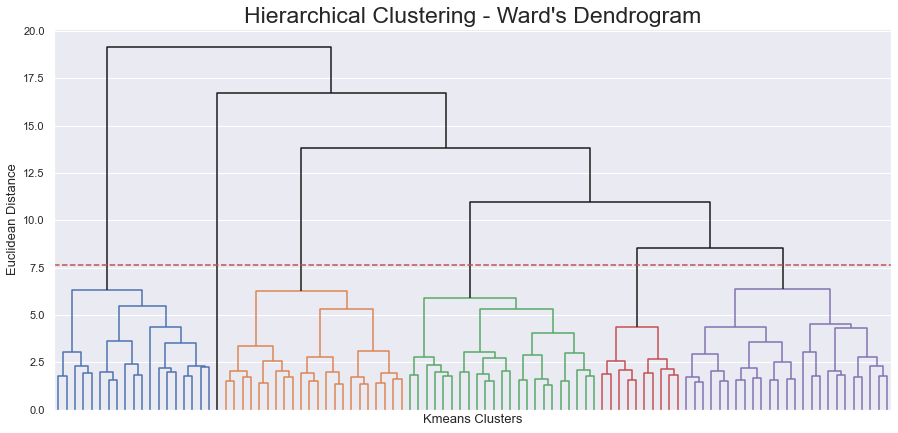

In [123]:
kmeans_Hierarchical(numerical_var_kmeans)

In [124]:
pt = PowerTransformer('yeo-johnson') # Yeo-Johnson by default, but specified to avoid confusion
numerical_var_kmeans[numerical_var_kmeans.columns] = pt.fit_transform(np.array(numerical_var_kmeans))
 
kmeans = KMeans(n_clusters=5, random_state=0).fit(numerical_var_kmeans)
numerical_var_kmeans['Cluster'] = pd.Series(kmeans.labels_,index=numerical_var_kmeans.index)
kmeans_clusters = numerical_var_kmeans.groupby("Cluster").mean()
kmeans_clusters[kmeans_clusters.columns] = pt.inverse_transform(np.array(kmeans_clusters))
kmeans_clusters

,YearlySal,AvgCustMonVal,YearsAsCust,SalPremRatio,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
Cluster,,,,,,,,,
0,38620.661450,10.510972,29.005998,0.022927,0.291417,0.386882,0.182886,0.050698,0.047776
1,41957.431727,2.696300,30.488961,0.016098,0.398753,0.136340,0.321601,0.047020,0.047950
2,20203.774130,4.670931,30.717151,0.034488,0.413439,0.171106,0.301288,0.036272,0.037148
3,31452.198021,5.452387,30.201199,0.020158,0.752481,0.055096,0.148333,0.012464,0.012098
4,14970.409888,7.037484,29.959903,0.059108,0.138600,0.453720,0.184442,0.077903,0.078537


findfont: Font family ['Roboto'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lobster Two'] not found. Falling back to DejaVu Sans.


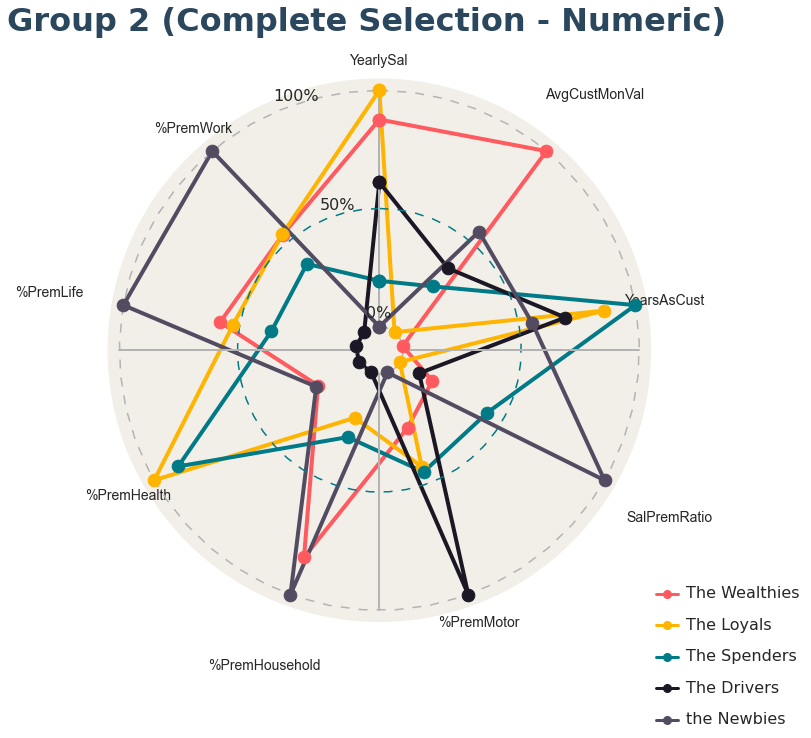

In [125]:
group_names=['The Wealthies','The Loyals','The Spenders','The Drivers','the Newbies']
title = 'Group 2 (Complete Selection - Numeric)'
Radar_Graph(kmeans_clusters,group_names,title)

For n_clusters = 2, the average silhouette_score is : 0.27092121862744006
For n_clusters = 3, the average silhouette_score is : 0.26908782059939396
For n_clusters = 4, the average silhouette_score is : 0.23546233866898794
For n_clusters = 5, the average silhouette_score is : 0.23380193130950216


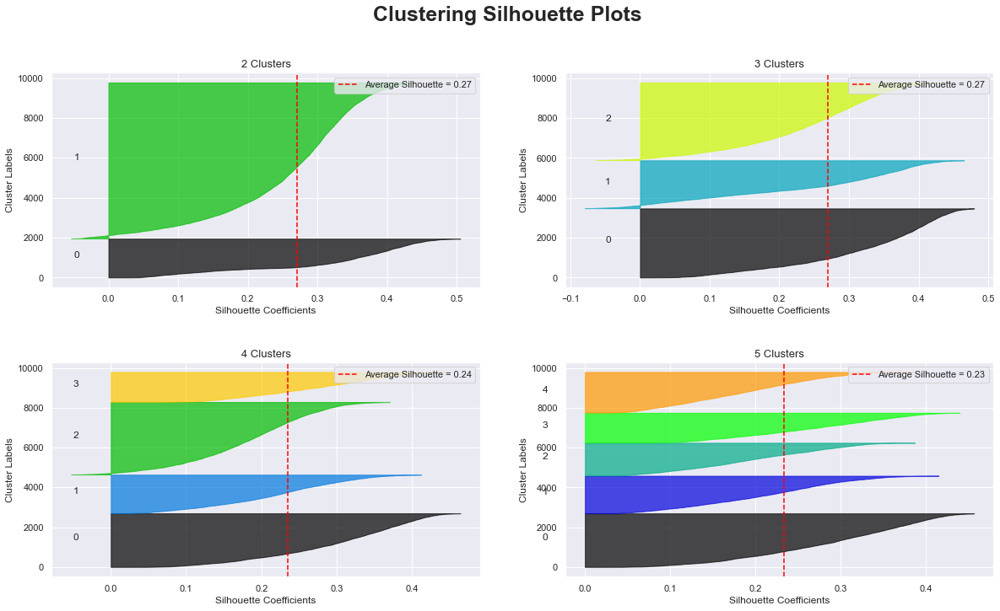

In [126]:
silhouette(numerical_var_kmeans, kmeans,range(2,6))

### Insurance Info

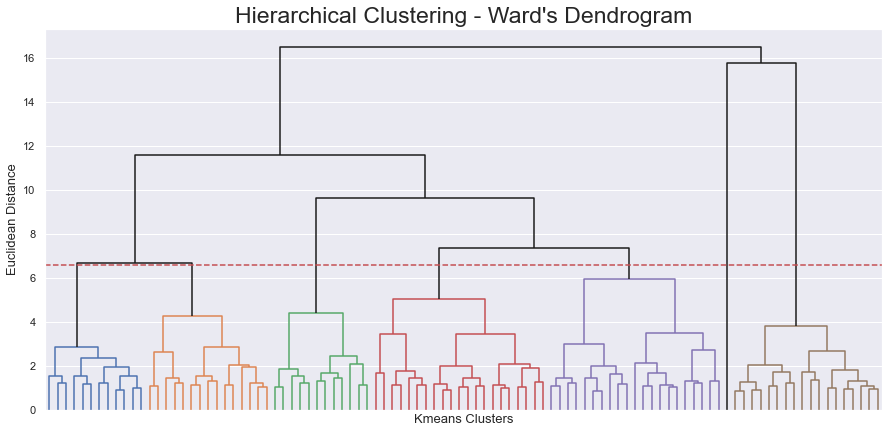

In [127]:
kmeans_Hierarchical(considered_df_InsuranceInfo)

In [128]:
pt = PowerTransformer('yeo-johnson') # Yeo-Johnson by default, but specified to avoid confusion
considered_df_InsuranceInfo[considered_df_InsuranceInfo.columns] = pt.fit_transform(np.array(considered_df_InsuranceInfo))

kmeans = KMeans(n_clusters=6, random_state=0).fit(considered_df_InsuranceInfo)
considered_df_InsuranceInfo['Cluster'] = pd.Series(kmeans.labels_,index=considered_df_InsuranceInfo.index)
InsuranceInfo_clusters = considered_df_InsuranceInfo.groupby("Cluster").mean()
InsuranceInfo_clusters[InsuranceInfo_clusters.columns] = pt.inverse_transform(np.array(InsuranceInfo_clusters))
 
InsuranceInfo_clusters

,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
Cluster,,,,,
0,0.312674,0.131635,0.346972,0.076838,0.078149
1,0.302550,0.350894,0.233347,0.018417,0.064121
2,0.139632,0.484859,0.151808,0.087682,0.088557
3,0.792345,0.047968,0.123277,0.010421,0.010384
4,0.559919,0.096788,0.275789,0.023711,0.022842
5,0.307350,0.353200,0.220797,0.065296,0.019237


For n_clusters = 3, the average silhouette_score is : 0.34843897232858884
For n_clusters = 4, the average silhouette_score is : 0.32645982557828335
For n_clusters = 5, the average silhouette_score is : 0.33613791344741395
For n_clusters = 6, the average silhouette_score is : 0.34232201484874225


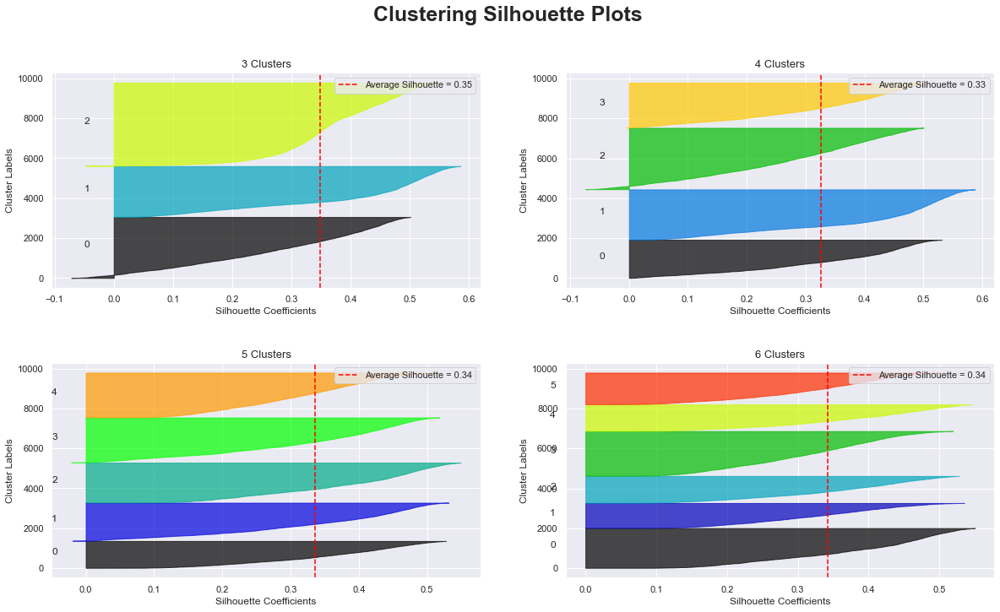

In [129]:
silhouette(considered_df_InsuranceInfo, kmeans,range(3,7))

## 4.2 Customer Background Clustering via K-prototypes <a class="anchor" id="4.2"></a>
- K-prototype Theoretical reference: https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.15.4028&rep=rep1&type=pdf ; https://github.com/nicodv/kmodes
- UMAP Theoretical reference: https://www.sciencedirect.com/science/article/pii/S0020025521004114
- UMAP Implementation reference: https://towardsdatascience.com/the-k-prototype-as-clustering-algorithm-for-mixed-data-type-categorical-and-numerical-fe7c50538ebb
- UMAP / K-prototype Code reference: https://antonsruberts.github.io/kproto-audience/

The K-Prototypes is an algorithm developed by Z. Huang, which aims to combine K-means and K-modes algorithm in order to allow clustering on mixed data types. Here, K-means is responsible for clustering numerical data based on Euclidean distance as the dissimiliarity measure, while K-modes handles categorical variables based on the number of matching categories between data points, replacing the cluster means with modes. Then Huang (1998) explains "frequency-based method to update modes in the clustering process to minimise the clustering cost function." The combined dissimiliarity measures of k-means and k-modes result in K-Prototypes which can be used to cluster data with both categorical and numerical variables.

**UMAP Visualization**

In [130]:
# Original code: https://antonsruberts.github.io/kproto-audience/
# changed some parts to fit the new umap version and as a part of debugging some lines.

def UMAP_viz(df,clusters):
    
    numerical = df.select_dtypes(exclude='object')
    
    ##preprocessing categorical
    categorical = df.select_dtypes(include='object')
    categorical = pd.get_dummies(categorical)

    #Percentage of columns which are categorical is used as weight parameter in embeddings later
    categorical_weight = len(df.select_dtypes(include='object').columns) / df.shape[1]

    #Embedding numerical & categorical
    fit1 = umap.UMAP(metric='l2',random_state=0).fit(numerical)
    fit2 = umap.UMAP(metric='dice',random_state=0).fit(categorical)

    #Augmenting the numerical embedding with categorical
    intersection = umap.general_simplicial_set_intersection(fit1.graph_, fit2.graph_, weight=categorical_weight)
    intersection = umap.reset_local_connectivity(intersection)
    embedding = umap.simplicial_set_embedding(fit1._raw_data, 
                                              intersection, 
                                              fit1.n_components, 
                                              fit1._initial_alpha,
                                              fit1._a,
                                              fit1._b, 
                                              fit1.repulsion_strength,
                                              fit1.negative_sample_rate, 
                                              200,
                                              'random',
                                              np.random,
                                              fit1.metric, 
                                              fit1._metric_kwds,
                                              densmap=False,
                                              densmap_kwds={},
                                              output_dens=False
                                              )

    embedding = embedding[0]
    plt.figure(figsize=(20, 10))
    scatter = plt.scatter(*embedding.T, s=2, cmap='Spectral', alpha=1.0, c=clusters)
    
    # produce a legend with the unique colors from the scatter
    plt.legend(*scatter.legend_elements(),loc="lower left", title="Classes")
    
    plt.show()

In [131]:
def kprot_cluster(kprot_data,k,umapV=True):
    categorical_columns = [i for i, x in enumerate(list(kprot_data.dtypes == np.dtype('O'))) if x == True] # Specify
    
    kproto = KPrototypes(n_clusters= k, init='Cao', n_jobs = -2,random_state=0)
    clusters = kproto.fit_predict(kprot_data, categorical=categorical_columns)
    
    if umapV:UMAP_viz(kprot_data,clusters)
    
    c = pd.Series(clusters,index=kprot_data.index,name='Clusters')
    
    return pd.concat([kprot_data,c],axis=1), kproto.cost_, clusters

In [132]:
def Elbow_kprot(kprot_data,n_clusters2try=6):

    #Elbow plot with cost (will take a LONG time)
    costs = []
    n_clusters = []
    clusters_assigned = []

    for i in tqdm(range(2, n_clusters2try+1)): # we are limiting the number of possible clusters
        try:
            df, cost, clusters = kprot_cluster(kprot_data,i,False)
            costs.append(cost)
            n_clusters.append(i)
            clusters_assigned.append(clusters)
        except:
            print(f"Can't cluster with {i} clusters")

    fig = go.Figure(data=go.Scatter(x=n_clusters, y=costs ))
    fig.show()

In [133]:
considered_df_all_Pct_prem

,EducDeg,Children,GeoLivArea,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork
CustID,,,,,,,,,,,,
1,2,1.0,1.0,31,26124.0,0.0255,12.29,0.564712,0.119373,0.219905,0.070632,0.025377
2,2,1.0,4.0,36,8124.0,0.1121,-3.64,0.085031,0.456881,0.128096,0.213489,0.116503
3,1,0.0,3.0,25,27324.0,0.0271,20.19,0.278355,0.303133,0.168215,0.116595,0.133702
4,3,1.0,4.0,27,13188.0,0.0455,-0.63,0.303789,0.072168,0.518030,0.058833,0.047180
5,3,1.0,4.0,30,21156.0,0.0297,1.17,0.538141,0.075965,0.290175,0.029846,0.065873
...,...,...,...,...,...,...,...,...,...,...,...,...
10291,1,1.0,3.0,22,7512.0,0.1734,8.01,0.005289,0.674317,0.079160,0.086752,0.154483
10292,4,0.0,2.0,33,38256.0,0.0168,-0.00,0.613723,0.077078,0.270918,0.015244,0.023038
10294,3,1.0,1.0,22,35016.0,0.0199,23.82,0.579728,0.190739,0.204312,0.018198,0.007023


In [134]:
# Data Prep
# Python implementation of K-prototype algorithm automatically handles categorical values (given they are specified, as we do with data type = Object), 
# one-hot encoding is not needed.
# Only numerical variables need normalization
cust_background_norm = considered_df_CustBackground.copy()
for c in cust_background_norm.select_dtypes(exclude='object').columns:
    pt = PowerTransformer() # YeoJohson by default
    cust_background_norm[c] =  pt.fit_transform(np.array(cust_background_norm[c]).reshape(-1, 1))

In [135]:
Elbow_kprot(cust_background_norm)

100%|██████████| 5/5 [10:13<00:00, 122.72s/it]


### 4.2.1 K-prototypes based on Customer Profile, K =3

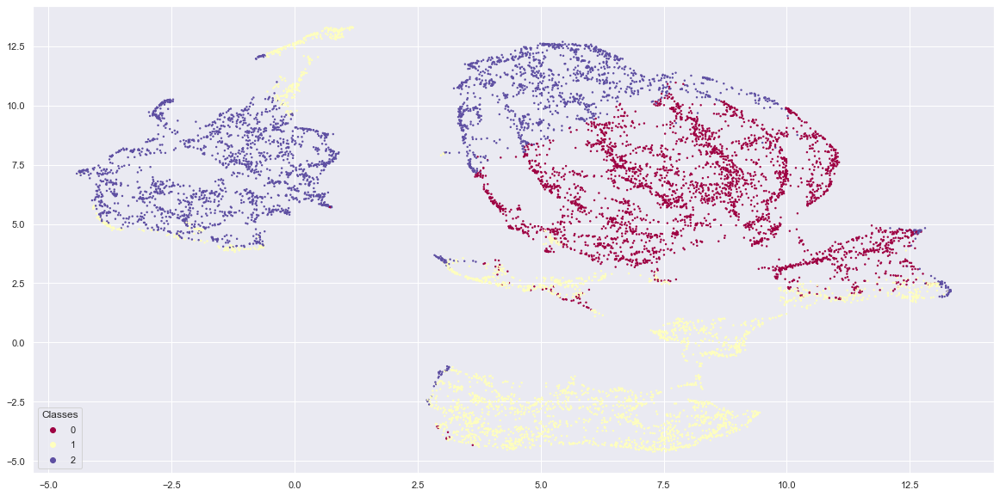

In [136]:
# Subtle elbows found at number of clusters = 3 and 5
np.random.seed(174)
cust_df_3, cust_cost_3, cust_clusters_3 = kprot_cluster(cust_background_norm, 3)

In [139]:
cust_df_3['Clusters'].value_counts().sort_index()

0    3346
1    3179
2    3229
Name: Clusters, dtype: int64

In [140]:
kprot_res_k3_df = considered_df_CustBackground.copy()
kprot_res_k3_df['Clusters'] = cust_df_3['Clusters']
kprot_3_num_res = kprot_res_k3_df.groupby('Clusters', as_index=False)[['YearsAsCust','YearlySal','SalPremRatio','AvgCustMonVal']].mean()
kprot_3_cat_res = kprot_res_k3_df.groupby('Clusters')[['EducDeg','Children','GeoLivArea']].agg(pd.Series.mode)
Kprot_k3_agg = kprot_3_cat_res.copy()
Kprot_k3_agg[kprot_3_num_res.columns] = kprot_3_num_res[kprot_3_num_res.columns]
Kprot_k3_agg

,EducDeg,Children,GeoLivArea,Clusters,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal
Clusters,,,,,,,,
0,3,1.0,4.0,0,35.807830,36504.168380,0.019738,4.306635
1,3,1.0,4.0,1,24.452658,36957.928657,0.020002,10.021412
2,3,1.0,4.0,2,30.424280,17229.123846,0.056459,8.082382


<AxesSubplot:xlabel='Clusters'>

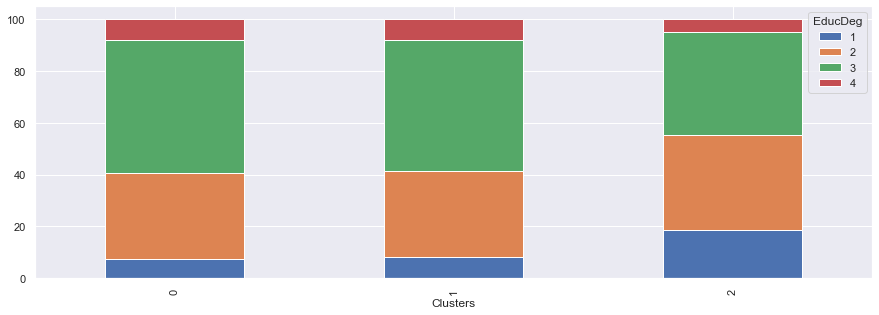

In [141]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = kprot_res_k3_df[['Clusters','EducDeg']].groupby(['Clusters','EducDeg'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

<AxesSubplot:xlabel='Clusters'>

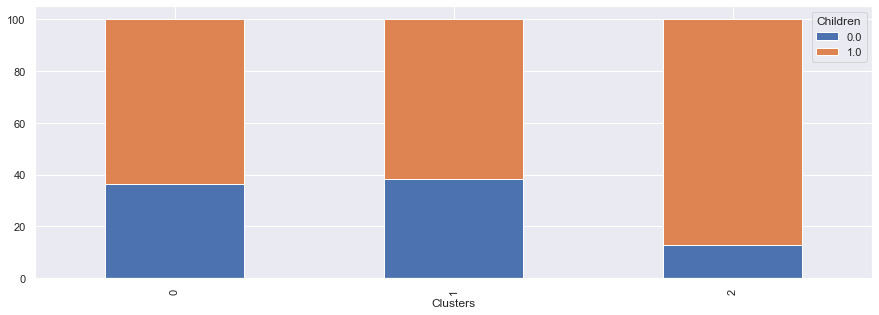

In [142]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = kprot_res_k3_df[['Clusters','Children']].groupby(['Clusters','Children'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

<AxesSubplot:xlabel='Clusters'>

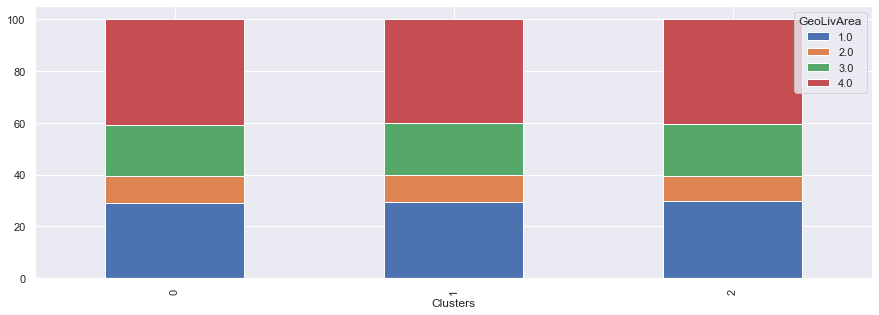

In [143]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = kprot_res_k3_df[['Clusters','GeoLivArea']].groupby(['Clusters','GeoLivArea'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

In [144]:
Kprot_k3_agg

,EducDeg,Children,GeoLivArea,Clusters,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal
Clusters,,,,,,,,
0,3,1.0,4.0,0,35.807830,36504.168380,0.019738,4.306635
1,3,1.0,4.0,1,24.452658,36957.928657,0.020002,10.021412
2,3,1.0,4.0,2,30.424280,17229.123846,0.056459,8.082382


### 4.2.2 K-prototypes based on Customer Profile, K = 5

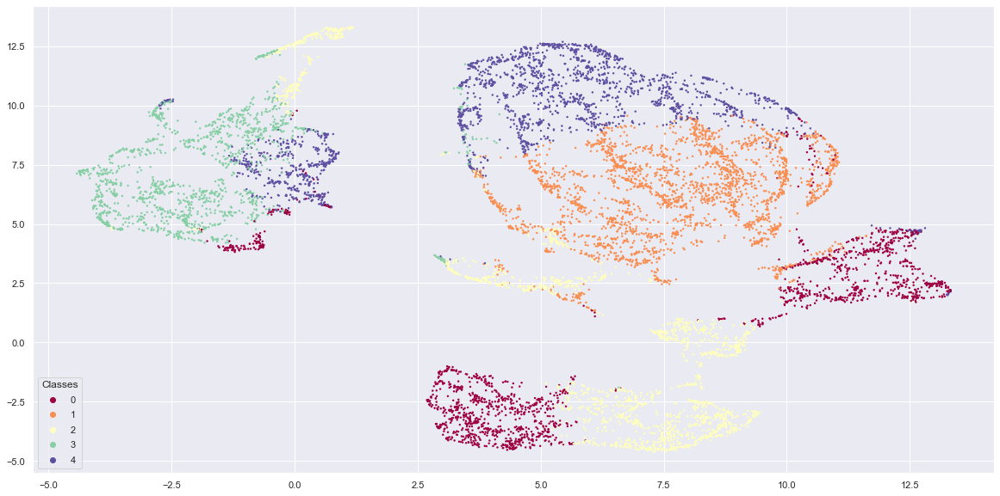

In [145]:
np.random.seed(174)
cust_df_5, cust_cost_5, cust_clusters_5 = kprot_cluster(cust_background_norm, 5)

In [146]:
cust_df_5['Clusters'].value_counts().sort_index()

0    1762
1    2625
2    1956
3    1427
4    1984
Name: Clusters, dtype: int64

In [147]:
kprot_res_k5_df = considered_df_CustBackground.copy()
kprot_res_k5_df['Clusters'] = cust_df_5['Clusters']
kprot_5_num_res = kprot_res_k5_df.groupby('Clusters', as_index=False)[['YearsAsCust','YearlySal','SalPremRatio','AvgCustMonVal']].mean()
kprot_5_cat_res = kprot_res_k5_df.groupby('Clusters')[['EducDeg','Children','GeoLivArea']].agg(pd.Series.mode)
Kprot_k5_agg = kprot_5_num_res.copy()
Kprot_k5_agg[kprot_5_cat_res.columns] = kprot_5_cat_res[kprot_5_cat_res.columns]
Kprot_k5_agg

,Clusters,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal,EducDeg,Children,GeoLivArea
0,0,25.253689,34475.018331,0.020792,-0.878405,3,1.0,4.0
1,1,36.560000,38118.056724,0.018840,5.336507,3,1.0,4.0
2,2,25.289877,37831.073006,0.019927,15.963727,3,1.0,4.0
3,3,25.447793,17205.450736,0.059043,14.909776,2,1.0,4.0
4,4,35.050403,18100.002671,0.051720,3.731956,3,1.0,4.0


<AxesSubplot:xlabel='Clusters'>

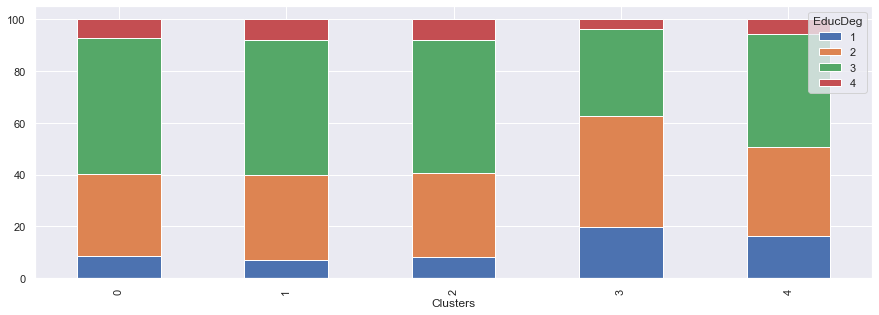

In [148]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = kprot_res_k5_df[['Clusters','EducDeg']].groupby(['Clusters','EducDeg'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

<AxesSubplot:xlabel='Clusters'>

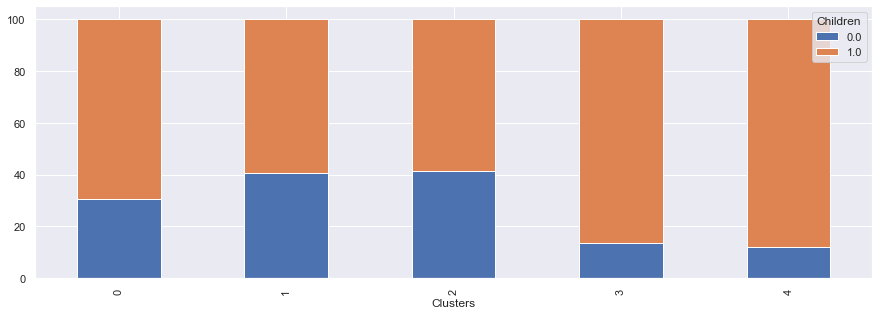

In [149]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = kprot_res_k5_df[['Clusters','Children']].groupby(['Clusters','Children'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

<AxesSubplot:xlabel='Clusters'>

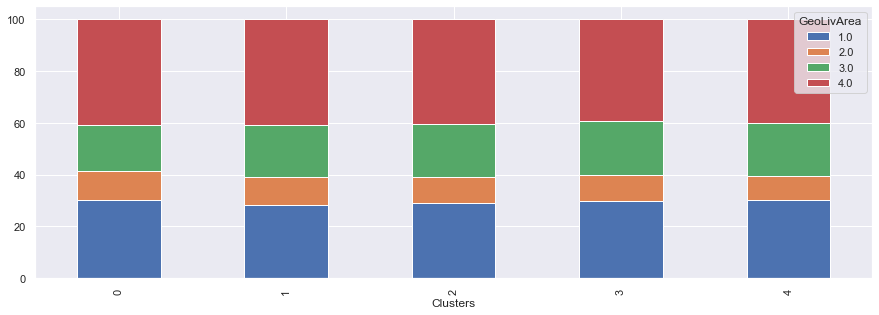

In [150]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = kprot_res_k5_df[['Clusters','GeoLivArea']].groupby(['Clusters','GeoLivArea'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

### 4.2.3 K-prototypes, behavior based on socio-demographics

In [151]:
socdem_norm = considered_df_CustBackground[['EducDeg','Children','GeoLivArea','YearlySal']]
for c in socdem_norm.select_dtypes(exclude='object').columns:
    pt = PowerTransformer() # YeoJohson by default
    socdem_norm[c] =  pt.fit_transform(np.array(socdem_norm[c]).reshape(-1, 1))
Elbow_kprot(socdem_norm)

100%|██████████| 5/5 [05:49<00:00, 69.96s/it]


In [152]:
socdem_norm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9754 entries, 1 to 10296
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   EducDeg     9754 non-null   object 
 1   Children    9754 non-null   object 
 2   GeoLivArea  9754 non-null   object 
 3   YearlySal   9754 non-null   float64
dtypes: float64(1), object(3)
memory usage: 639.1+ KB


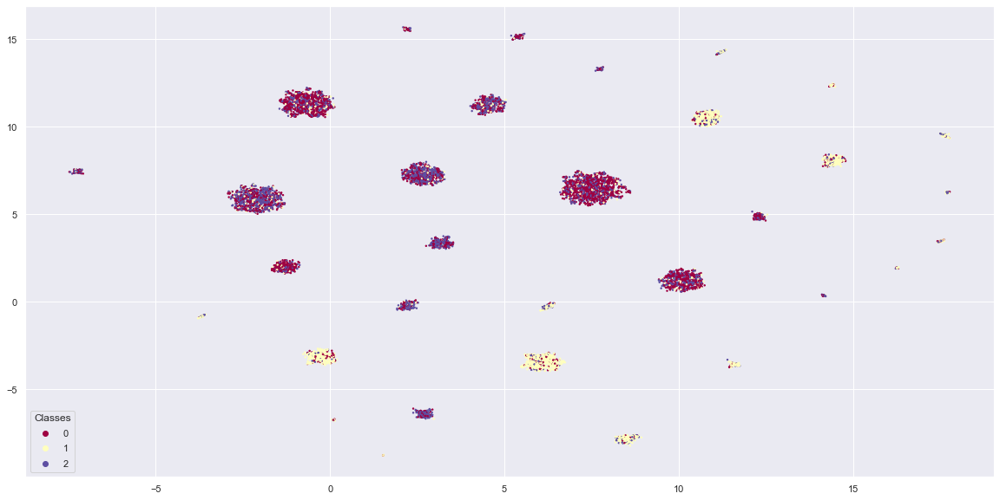

In [153]:
np.random.seed(174)
cust_df_sd, cust_cost_sd, cust_clusters_sd = kprot_cluster(socdem_norm, 3)

In [154]:
cust_df_sd['Clusters'].value_counts().sort_index()

0    4030
1    2773
2    2951
Name: Clusters, dtype: int64

In [155]:
kprot_res_sd_df = considered_df_CustBackground.copy()
kprot_res_sd_df['Clusters'] = cust_df_sd['Clusters']
kprot_sd_num_res = kprot_res_sd_df.groupby('Clusters', as_index=False)['YearlySal'].mean()
kprot_sd_cat_res = kprot_res_sd_df.groupby('Clusters')[['EducDeg','Children','GeoLivArea']].agg(pd.Series.mode)
Kprot_sd_agg = kprot_sd_num_res.copy()
Kprot_sd_agg[kprot_sd_cat_res.columns] = kprot_sd_cat_res[kprot_sd_cat_res.columns]
Kprot_sd_agg

,Clusters,YearlySal,EducDeg,Children,GeoLivArea
0,0,30655.379529,3,1.0,4.0
1,1,44336.931843,3,0.0,4.0
2,2,16529.160285,2,1.0,4.0


**extract the insurance pattern from the original data to show different behavior per cluster**

In [156]:
all_sd_cluster = considered_df_all_Pct_prem.copy()
all_sd_cluster['Clusters'] = cust_df_sd['Clusters']

numerical = all_sd_cluster.select_dtypes(exclude='object').columns
categorical = all_sd_cluster.select_dtypes(include='object').columns

all_sd_cluster_num = all_sd_cluster.groupby('Clusters', as_index=False)[numerical].mean() # Mean
all_sd_cluster_cat = all_sd_cluster.groupby('Clusters')[categorical].agg(pd.Series.mode)

all_sd_agg = all_sd_cluster_cat.copy()
all_sd_agg[all_sd_cluster_num.columns] = all_sd_cluster_num[all_sd_cluster_num.columns]
all_sd_agg

all_sd_agg

,EducDeg,Children,GeoLivArea,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,Clusters
Clusters,,,,,,,,,,,,,
0,3,1.0,4.0,30.455583,30655.379529,0.022993,7.333717,0.578531,0.153088,0.198636,0.035244,0.034500,0
1,3,0.0,4.0,30.080418,44336.931843,0.017097,7.073678,0.392680,0.234062,0.270184,0.052512,0.050562,1
2,2,1.0,4.0,30.375805,16529.160285,0.058238,7.860349,0.315654,0.303365,0.243656,0.069682,0.067644,2


**based on Median**

In [157]:
all_sd_med_cluster = considered_df_all_Pct_prem.copy()
all_sd_med_cluster['Clusters'] = cust_df_sd['Clusters']

numerical = all_sd_med_cluster.select_dtypes(exclude='object').columns
categorical = all_sd_med_cluster.select_dtypes(include='object').columns

all_sd_med_cluster_num = all_sd_med_cluster.groupby('Clusters', as_index=False)[numerical].median() # Median
all_sd_med_cluster_cat = all_sd_med_cluster.groupby('Clusters')[categorical].agg(pd.Series.mode)

all_sd_med_agg = all_sd_med_cluster_cat.copy()
all_sd_med_agg[all_sd_med_cluster_num.columns] = all_sd_med_cluster_num[all_sd_med_cluster_num.columns]
all_sd_med_agg

all_sd_med_agg

,EducDeg,Children,GeoLivArea,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,Clusters
Clusters,,,,,,,,,,,,,
0,3,1.0,4.0,30,30654.0,0.0219,6.32,0.588571,0.124064,0.184166,0.022783,0.024058,0
1,3,0.0,4.0,30,44100.0,0.0163,6.07,0.366273,0.210449,0.257484,0.041080,0.039404,1
2,2,1.0,4.0,30,16956.0,0.0458,6.02,0.271214,0.283411,0.233413,0.052036,0.053609,2


<AxesSubplot:xlabel='Clusters', ylabel='YearsAsCust'>

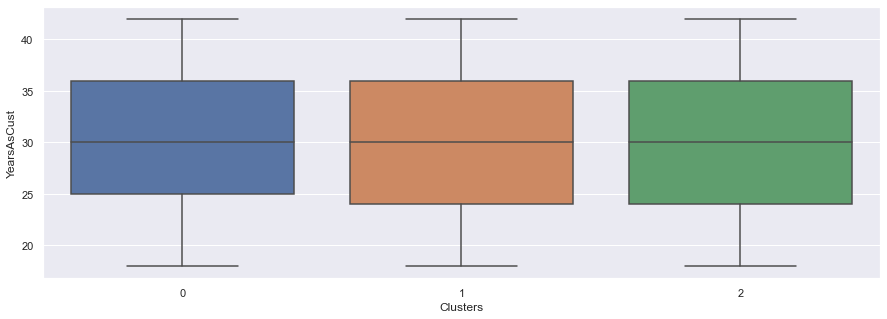

In [158]:
# YearsAsCust
sns.boxplot(data=all_sd_med_cluster, y='YearsAsCust', x = 'Clusters')

### 4.2.4 K-prototypes, clustering based on all features

In [159]:
all_norm = considered_df_all_Pct_prem.copy()
for c in all_norm.select_dtypes(exclude='object').columns:
    pt = PowerTransformer() # YeoJohson by default
    all_norm[c] =  pt.fit_transform(np.array(all_norm[c]).reshape(-1, 1))
Elbow_kprot(all_norm)

100%|██████████| 5/5 [08:30<00:00, 102.16s/it]


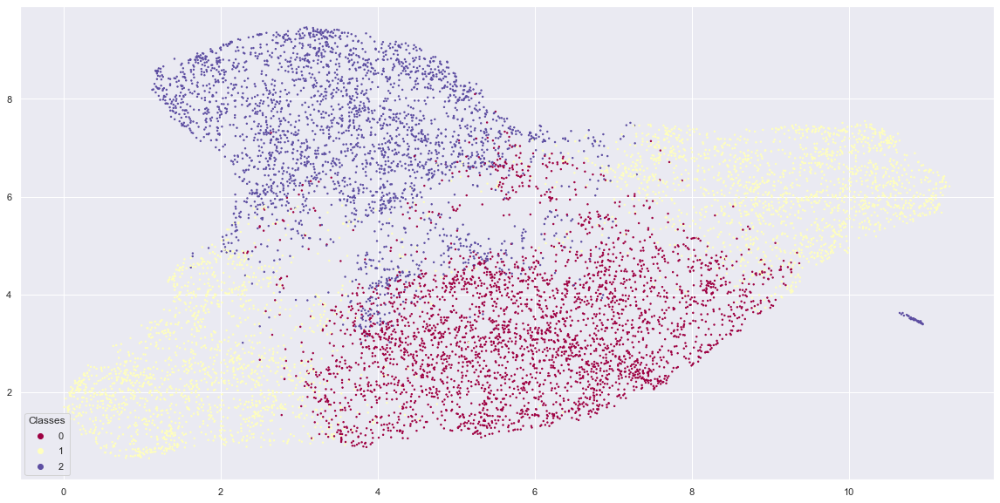

In [160]:
np.random.seed(174)
all_Pct_clusters,cost, clusters = kprot_cluster(all_norm,3)

In [161]:
all_Pct_clusters['Clusters'].value_counts().sort_index()

0    3267
1    3624
2    2863
Name: Clusters, dtype: int64

In [162]:
all_pct_cluster = considered_df_all_Pct_prem.copy()
all_pct_cluster['Clusters'] = all_Pct_clusters['Clusters']

numerical = all_pct_cluster.select_dtypes(exclude='object').columns
categorical = all_pct_cluster.select_dtypes(include='object').columns

all_pct_cluster_num = all_pct_cluster.groupby('Clusters', as_index=False)[numerical].mean()
all_pct_cluster_cat = all_pct_cluster.groupby('Clusters')[categorical].agg(pd.Series.mode)

all_pct_agg = all_pct_cluster_cat.copy()
all_pct_agg[all_pct_cluster_num.columns] = all_pct_cluster_num[all_pct_cluster_num.columns]
all_pct_agg

all_pct_agg

,EducDeg,Children,GeoLivArea,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,Clusters
Clusters,,,,,,,,,,,,,
0,3,0.0,4.0,30.089991,41021.945638,0.018704,6.552185,0.352068,0.239195,0.286904,0.061509,0.060324,0
1,3,1.0,4.0,30.415563,30158.780602,0.022516,7.103695,0.704284,0.079693,0.181421,0.017504,0.017098,1
2,2,1.0,4.0,30.477820,18145.625637,0.059109,8.807649,0.226806,0.381058,0.235406,0.079950,0.076780,2


<AxesSubplot:xlabel='Clusters'>

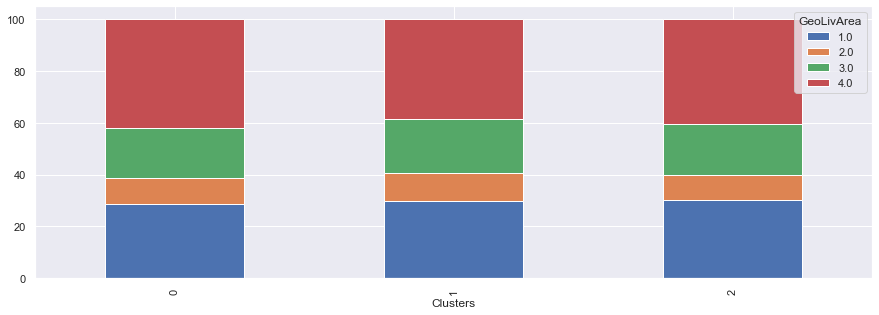

In [163]:
plt.rcParams['figure.figsize'] = [15, 5]
aggre = all_pct_cluster[['Clusters','GeoLivArea']].groupby(['Clusters','GeoLivArea'])['Clusters'].agg(Frequency='count')
ratio = aggre.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))
ratio.Frequency.unstack().plot.bar(stacked=True)

**median based**

In [164]:
all_pct_med_cluster = considered_df_all_Pct_prem.copy()
all_pct_med_cluster['Clusters'] = all_Pct_clusters['Clusters']

numerical = all_pct_med_cluster.select_dtypes(exclude='object').columns
categorical = all_pct_med_cluster.select_dtypes(include='object').columns

all_pct_med_cluster_num = all_pct_med_cluster.groupby('Clusters', as_index=False)[numerical].median()
all_pct_med_cluster_cat = all_pct_med_cluster.groupby('Clusters')[categorical].agg(pd.Series.mode)

all_pct_med_agg = all_pct_med_cluster_cat.copy()
all_pct_med_agg[all_pct_med_cluster_num.columns] = all_pct_med_cluster_num[all_pct_med_cluster_num.columns]
all_pct_med_agg

all_pct_med_agg

,EducDeg,Children,GeoLivArea,YearsAsCust,YearlySal,SalPremRatio,AvgCustMonVal,%PremMotor,%PremHousehold,%PremHealth,%PremLife,%PremWork,Clusters
Clusters,,,,,,,,,,,,,
0,3,0.0,4.0,30,41724.0,0.0182,5.830,0.355163,0.225410,0.276533,0.051137,0.050439,0
1,3,1.0,4.0,30,29796.0,0.0212,4.785,0.699412,0.079432,0.170789,0.013950,0.015271,1
2,2,1.0,4.0,30,17424.0,0.0465,6.840,0.212908,0.371226,0.224687,0.065947,0.064368,2


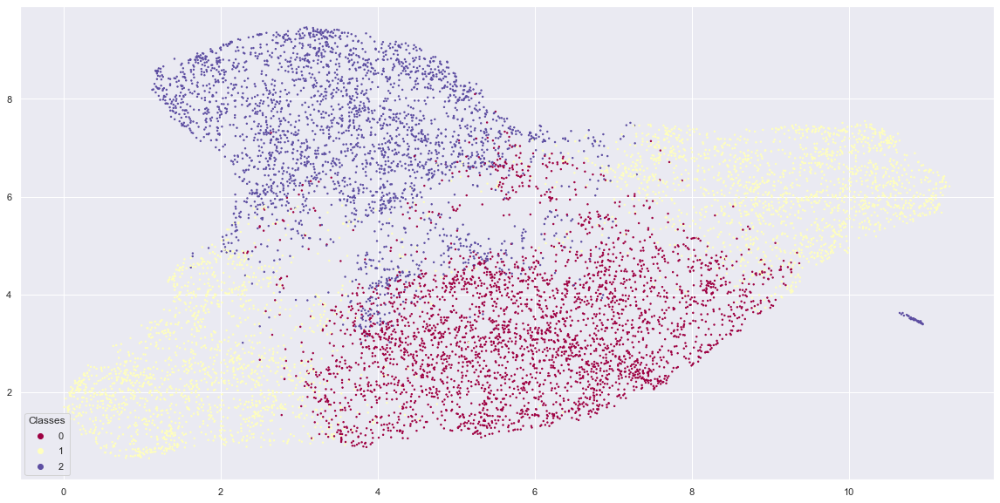

In [165]:
np.random.seed(174)
all_Pct_clusters,cost, clusters = kprot_cluster(all_norm,3)